In [1]:
import pandas as pd
diabetes = pd.read_csv('diabetes.csv')
diabetes.head()

,PatientID,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age,Diabetic
0,1354778,0,171,80,34,23,43.509726,1.213191,21,0
1,1147438,8,92,93,47,36,21.240576,0.158365,23,0
2,1640031,7,115,47,52,35,41.511523,0.079019,23,0
3,1883350,9,103,78,25,304,29.582192,1.282870,43,1
4,1424119,1,85,59,27,35,42.604536,0.549542,22,0


In [2]:
features = ['Pregnancies','PlasmaGlucose','DiastolicBloodPressure','TricepsThickness','SerumInsulin','BMI','DiabetesPedigree','Age']
target = 'Diabetic'
X, y = diabetes[features], diabetes[target]
print('X:')
display(X)
print('\ny:')
display(y)

X:


,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age
0,0,171,80,34,23,43.509726,1.213191,21
1,8,92,93,47,36,21.240576,0.158365,23
2,7,115,47,52,35,41.511523,0.079019,23
3,9,103,78,25,304,29.582192,1.282870,43
4,1,85,59,27,35,42.604536,0.549542,22
...,...,...,...,...,...,...,...,...
14995,10,65,60,46,177,33.512468,0.148327,41
14996,2,73,66,27,168,30.132636,0.862252,38
14997,0,93,89,43,57,18.690683,0.427049,24
14998,0,132,98,18,161,19.791645,0.302257,23



y:


0        0
1        0
2        0
3        1
4        0
        ..
14995    1
14996    1
14997    0
14998    0
14999    1
Name: Diabetic, Length: 15000, dtype: int64

In [3]:
pd.Series(y).value_counts(normalize=True)

Diabetic
0    0.666667
1    0.333333
Name: proportion, dtype: float64

In [4]:
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   PatientID               15000 non-null  int64  
 1   Pregnancies             15000 non-null  int64  
 2   PlasmaGlucose           15000 non-null  int64  
 3   DiastolicBloodPressure  15000 non-null  int64  
 4   TricepsThickness        15000 non-null  int64  
 5   SerumInsulin            15000 non-null  int64  
 6   BMI                     15000 non-null  float64
 7   DiabetesPedigree        15000 non-null  float64
 8   Age                     15000 non-null  int64  
 9   Diabetic                15000 non-null  int64  
dtypes: float64(2), int64(8)
memory usage: 1.1 MB


In [5]:
X.describe()

,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,3.224533,107.856867,71.220667,28.814000,137.852133,31.509646,0.398968,30.137733
std,3.391020,31.981975,16.758716,14.555716,133.068252,9.759000,0.377944,12.089703
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200512,0.078044,21.000000
25%,0.000000,84.000000,58.000000,15.000000,39.000000,21.259887,0.137743,22.000000
50%,2.000000,104.000000,72.000000,31.000000,83.000000,31.767940,0.200297,24.000000
75%,6.000000,129.000000,85.000000,41.000000,195.000000,39.259692,0.616285,35.000000
max,14.000000,192.000000,117.000000,93.000000,799.000000,56.034628,2.301594,77.000000


Unique values: 15


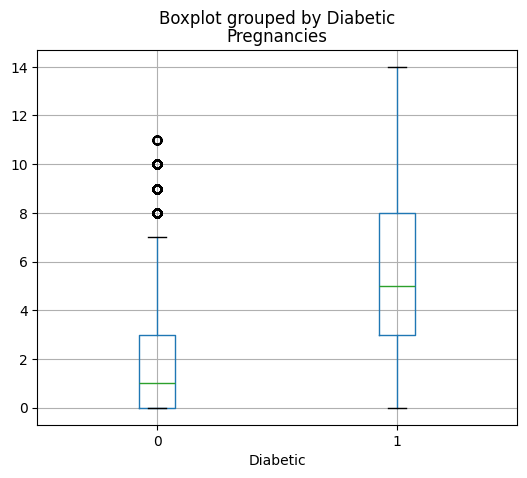

Unique values: 149


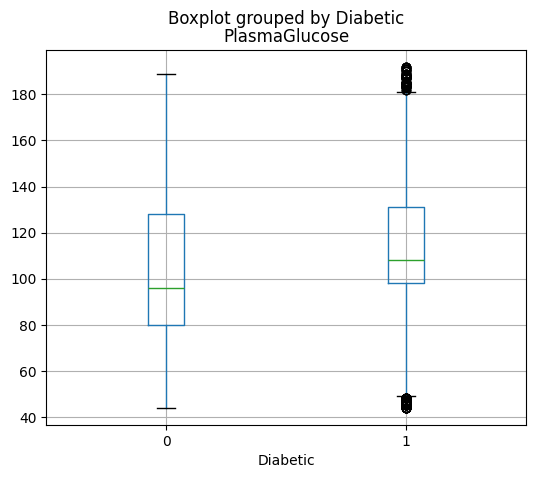

Unique values: 90


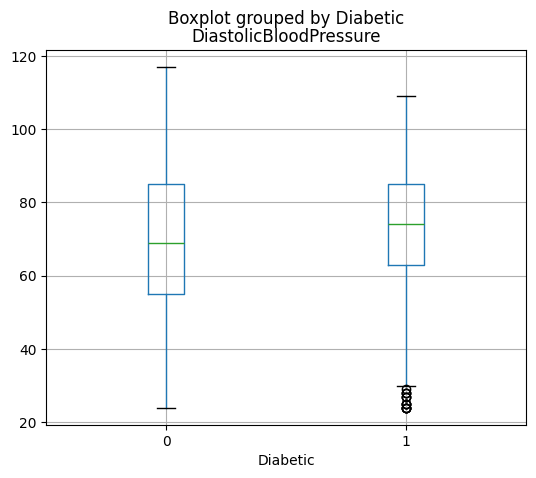

Unique values: 69


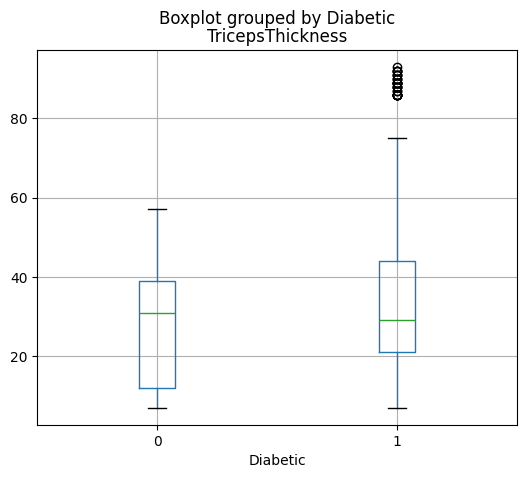

Unique values: 663


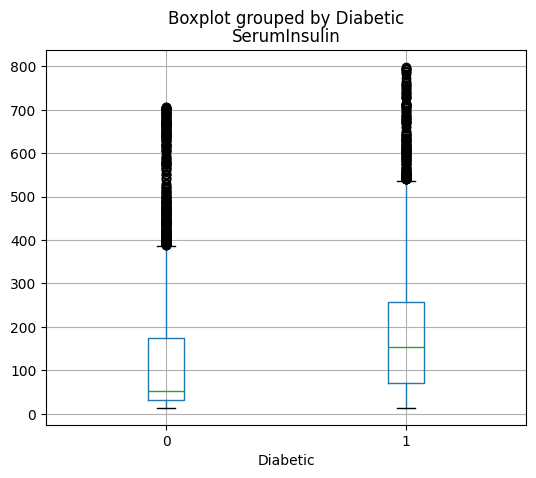

Unique values: 15000


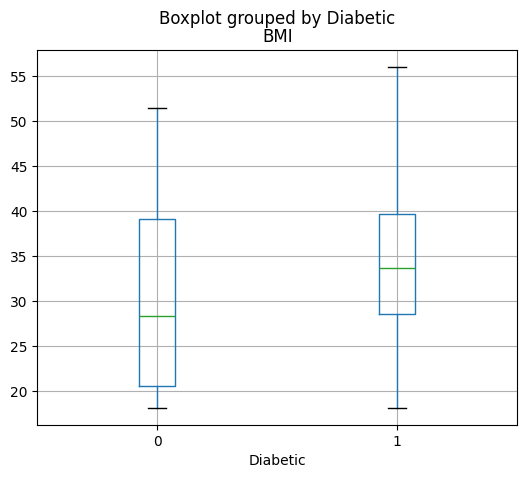

Unique values: 14999


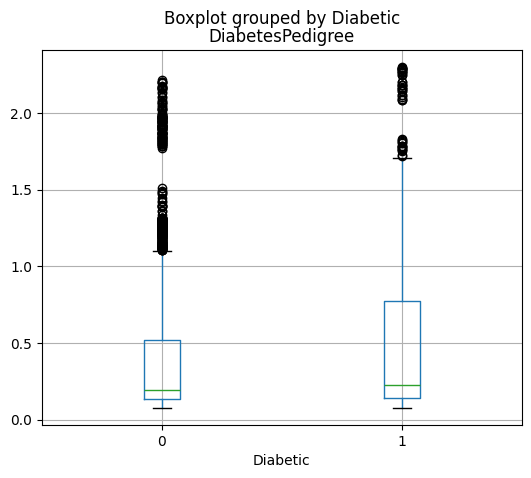

Unique values: 56


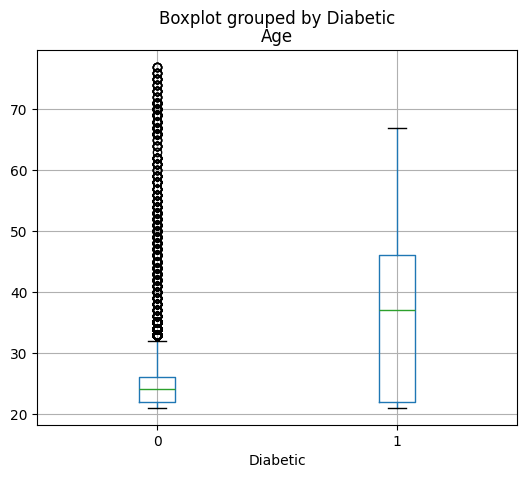

In [6]:
import matplotlib.pyplot as plt
for col in features:
    print(f'Unique values: {len(diabetes[col].unique())}')
    diabetes.boxplot(column=col, by='Diabetic', figsize=(6,5))
    plt.title(col)
    plt.show()

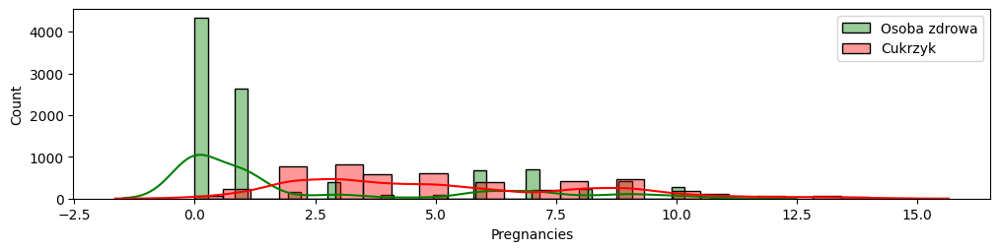

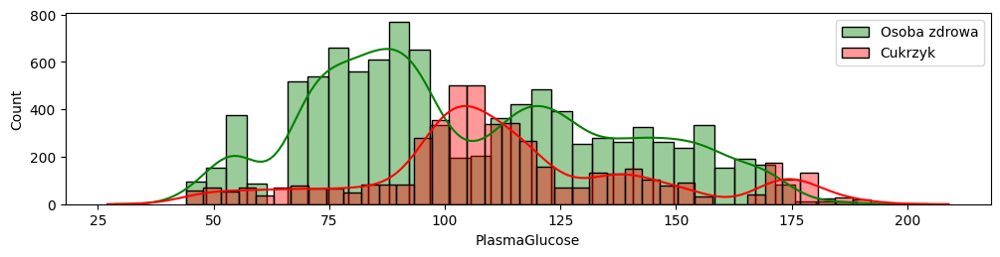

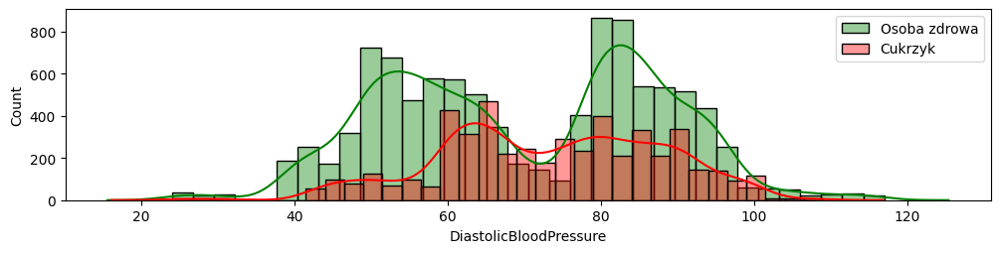

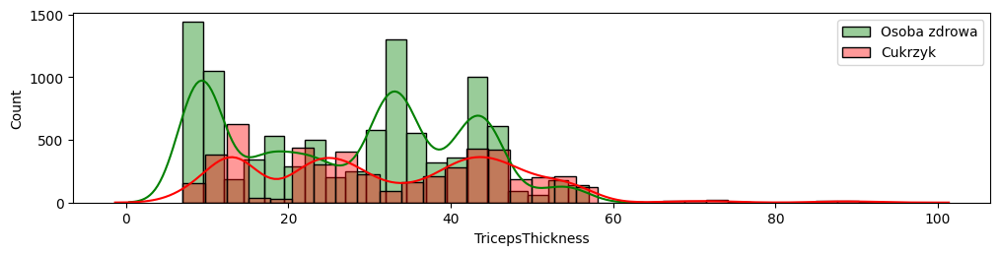

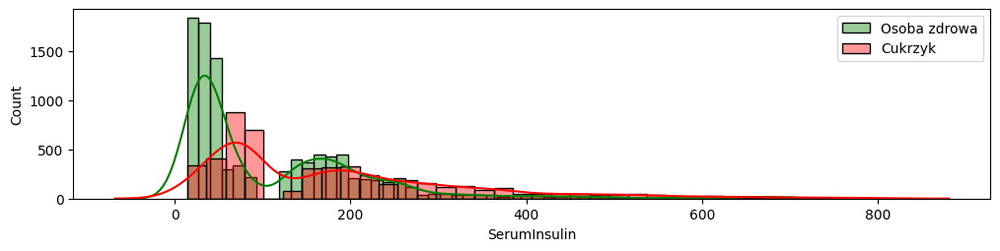

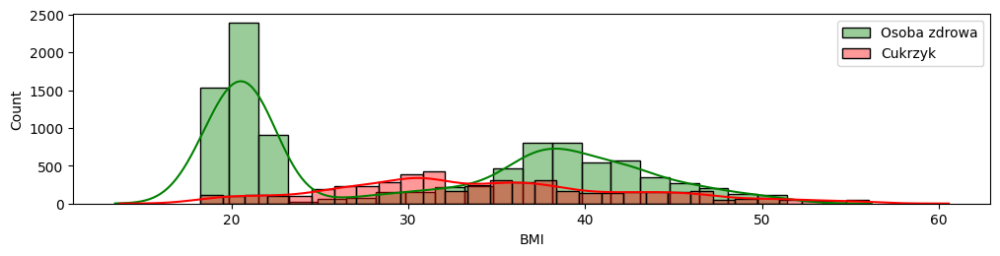

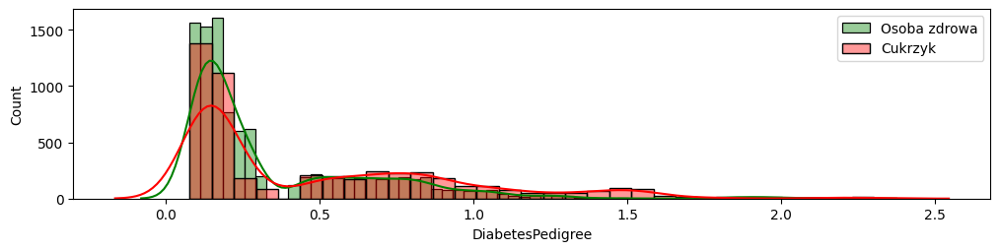

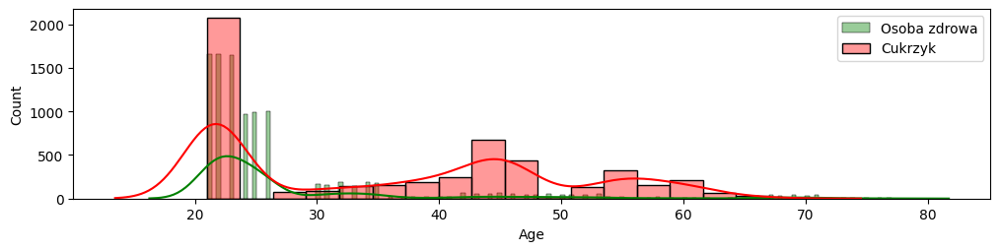

In [7]:
import seaborn as sns
for col in features:
    plt.figure(figsize=(12, 2.5))
    sns.histplot(diabetes.loc[diabetes['Diabetic']==0, col], kde=True, kde_kws=dict(cut=3), color='green', alpha=.4, label='Osoba zdrowa')
    sns.histplot(diabetes.loc[diabetes['Diabetic']==1, col], kde=True, kde_kws=dict(cut=3), color='red', alpha=.4, label='Cukrzyk')
    # sns.distplot(diabetes.loc[diabetes['Diabetic']==0, col], kde=True, color='green', label='Osoba zdrowa')
    # sns.distplot(diabetes.loc[diabetes['Diabetic']==1, col], kde=True, color='red', label='Cukrzyk')
    plt.legend(loc='upper right')
    plt.show()

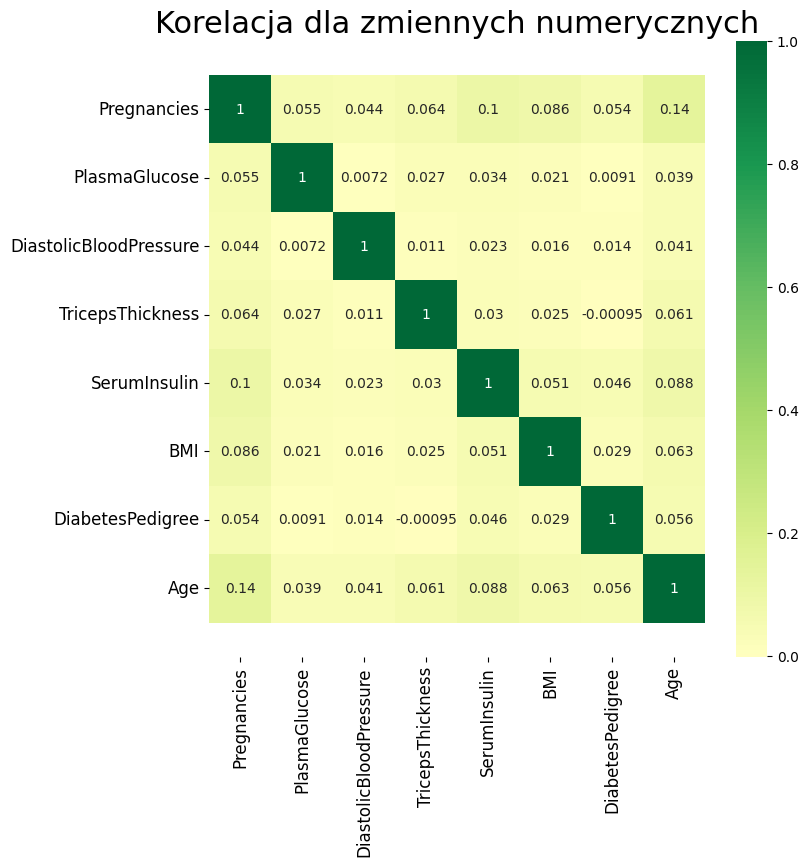

In [8]:
plt.figure(figsize=(8, 8))
ax = sns.heatmap(X.corr(),
                 xticklabels=X.corr().columns,
                 yticklabels=X.corr().columns,
                 cmap='RdYlGn',
                 center=0,
                 annot=True)

plt.title('Korelacja dla zmiennych numerycznych', fontsize=22)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [9]:
from scipy import stats

corr_dict = {}
for col in features:
    corr_dict[col] = stats.pointbiserialr(X[col], y)[0]
pd.Series(corr_dict).sort_values(ascending=False)

Pregnancies               0.407315
Age                       0.342605
SerumInsulin              0.247375
BMI                       0.210508
DiabetesPedigree          0.170302
TricepsThickness          0.152505
PlasmaGlucose             0.128004
DiastolicBloodPressure    0.091307
dtype: float64

In [10]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X[['Pregnancies', 'Age']], y, test_size=0.30, random_state=0, stratify=y)
print ('Treningowe obserwacje: %d\nTestowe obserwacje: %d' % (X_train.shape[0], X_test.shape[0]))

Treningowe obserwacje: 10500
Testowe obserwacje: 4500


In [11]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

scaler_2var = StandardScaler()
X_train_standardized = scaler_2var.fit_transform(X_train)
X_test_standardized = scaler_2var.transform(X_test)
model_lr = LogisticRegression()
model_lr.fit(X_train_standardized, y_train)

,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'lbfgs'
,max_iter,100
,multi_class,'deprecated'


C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


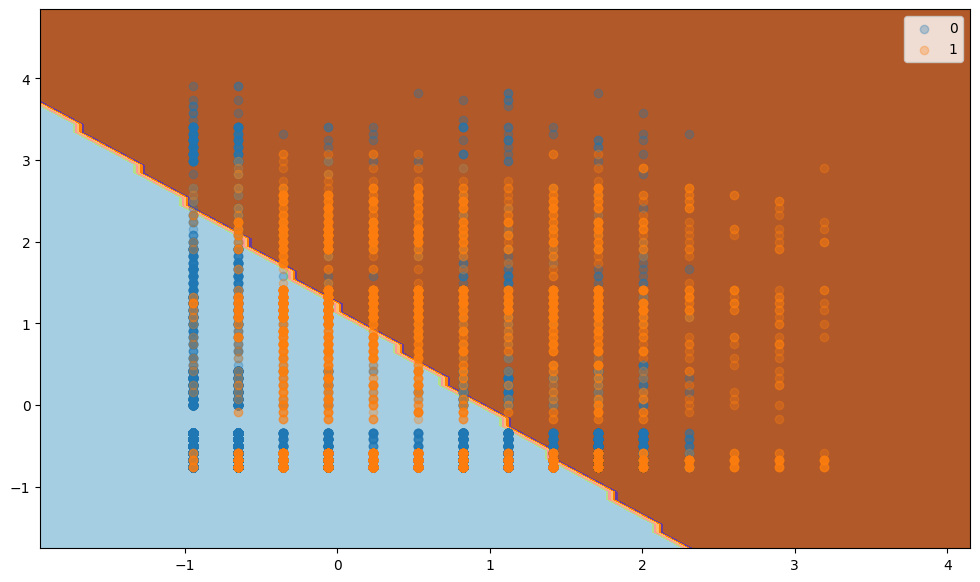

In [12]:
from numpy import where
from numpy import meshgrid
from numpy import arange
from numpy import hstack

def plot_classification_surface(X_plot, y_plot, trained_model):
    plt.figure(figsize=(12, 7))

    # określenie granic zbioru
    min1, max1 = X_plot[:, 0].min()-1, X_plot[:, 0].max()+1
    min2, max2 = X_plot[:, 1].min()-1, X_plot[:, 1].max()+1

    # skalowanie dla obu osi
    x1grid = arange(min1, max1, 0.1)
    x2grid = arange(min2, max2, 0.1)

    # utworzenie siatki
    xx, yy = meshgrid(x1grid, x2grid)

    # przetworzenie siatki w wektor
    r1, r2 = xx.flatten(), yy.flatten()
    r1, r2 = r1.reshape((len(r1), 1)), r2.reshape((len(r2), 1))

    # stworzenie zmiennych objaśniających dla modelu
    grid = hstack((r1,r2))

    # predykcja modelu zbioru
    yhat = trained_model.predict(grid)

    # przetworzenie predykcji na decyzji dla konkretnego punktu wykresu
    zz = yhat.reshape(xx.shape)

    # wizualizacja siatki z przyporządkowaną klasą
    plt.contourf(xx, yy, zz, cmap='Paired')

    # tworzenie wykresu punktowego dla klas ze zbioru X
    for class_value in range(2):

        # przyporządkowanie klasy (y) do obsewacji (X)
        row_ix = where(y_plot == class_value)

        # stworzenie wykresu punktowego
        plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)

    # wizualizacja wykresu
    plt.legend(loc='upper right')
    plt.show()

plot_classification_surface(X_plot=X_train_standardized, y_plot=y_train, trained_model=model_lr)

### Ocena modelu

In [13]:
predictions_lr = model_lr.predict(X_test_standardized)
print('Predicted labels: ', predictions_lr[:5], predictions_lr[-5:])
print('Actual labels:    ' , y_test[:5].values, y_test[-5:].values)

Predicted labels:  [0 0 1 0 0] [1 0 1 0 0]
Actual labels:     [0 1 0 0 0] [1 1 0 0 0]


#### Macierz omyłek

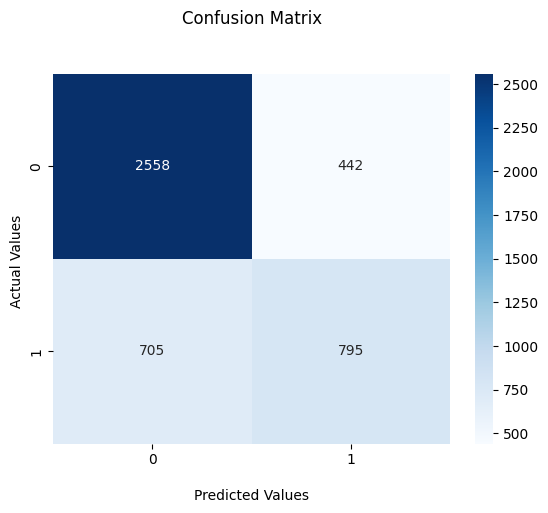

In [14]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, predictions_lr)
ax = sns.heatmap(cm, annot=True, cmap='Blues', fmt='.0f')
ax.set_title('Confusion Matrix\n\n')
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ')
plt.show()

In [15]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

print('Accuracy: ', accuracy_score(y_test, predictions_lr))
print("Precision:", precision_score(y_test, predictions_lr))
print("Recall:", recall_score(y_test, predictions_lr))
print("F1_score:", f1_score(y_test, predictions_lr))

Accuracy:  0.7451111111111111
Precision: 0.6426839126919968
Recall: 0.53
F1_score: 0.5809280233832663


In [16]:
from sklearn.metrics import classification_report

print(classification_report(y_test, predictions_lr))

              precision    recall  f1-score   support

           0       0.78      0.85      0.82      3000
           1       0.64      0.53      0.58      1500

    accuracy                           0.75      4500
   macro avg       0.71      0.69      0.70      4500
weighted avg       0.74      0.75      0.74      4500



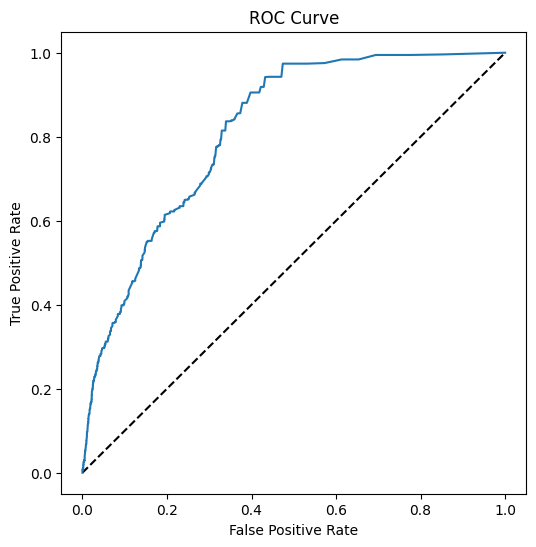

AUC: 0.8164931111111111


In [17]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

# prognoza prawdopodobieństwa
predictions_probability_lr = model_lr.predict_proba(X_test_standardized)

# obliczenie FPR oraz TPR w zależności od punktu odcięcia
fpr, tpr, thresholds = roc_curve(y_test, predictions_probability_lr[:,1])

# wizualizacja ROC Curve
fig = plt.figure(figsize=(6, 6))

# rysowanie prostej dla modelu losowego
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

# obliczenie AUC
auc = roc_auc_score(y_test, predictions_probability_lr[:,1])
print('AUC: ' + str(auc))

## Funkcja do spradzania metryk

In [18]:
metrics_dataframe = pd.DataFrame(columns = ['Model', 'F1_score', 'AUC'])
metrics_dataframe
models = []
models_names = []
predictions_proba_list = []
def calculate_metrics(model, name, X_checked, y_checked):
    models.append(model)
    models_names.append(name)
    global metrics_dataframe
    predictions = model.predict(X_checked)
    predictions_proba = model.predict_proba(X_checked)
    predictions_proba_list.append(predictions_proba[:,1])

    ############## metryki dla sprawdzanego modelu ################
    # Precision, Recall, F1, Accuracy
    print(classification_report(y_checked, predictions))

    # Confusion matrix
    plt.figure()
    cm = confusion_matrix(y_checked, predictions)
    ax = sns.heatmap(cm, annot=True, cmap='Blues', fmt='.0f')
    ax.set_title('Confusion Matrix\n\n')
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ')
    plt.show()

    # plot ROC curve
    fig = plt.figure(figsize=(6, 6))
    plt.plot([0, 1], [0, 1], 'k--')
    for model_selected, name_selected, pred_proba in zip(models, models_names, predictions_proba_list):
        fpr, tpr, thresholds = roc_curve(y_checked, pred_proba)
        plt.plot(fpr, tpr, label=name_selected)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.show()

    f1_metric = f1_score(y_checked, predictions)
    auc_metric = roc_auc_score(y_checked, predictions_proba[:,1])
    new_row = pd.DataFrame({'Model': [name], 'F1_score': [f1_metric], 'AUC': [auc_metric]})
    metrics_dataframe = pd.concat([metrics_dataframe, new_row], ignore_index=True)
    return metrics_dataframe

              precision    recall  f1-score   support

           0       0.78      0.85      0.82      3000
           1       0.64      0.53      0.58      1500

    accuracy                           0.75      4500
   macro avg       0.71      0.69      0.70      4500
weighted avg       0.74      0.75      0.74      4500



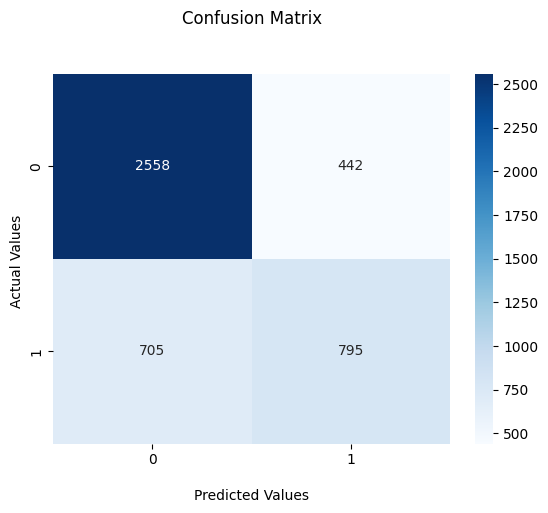

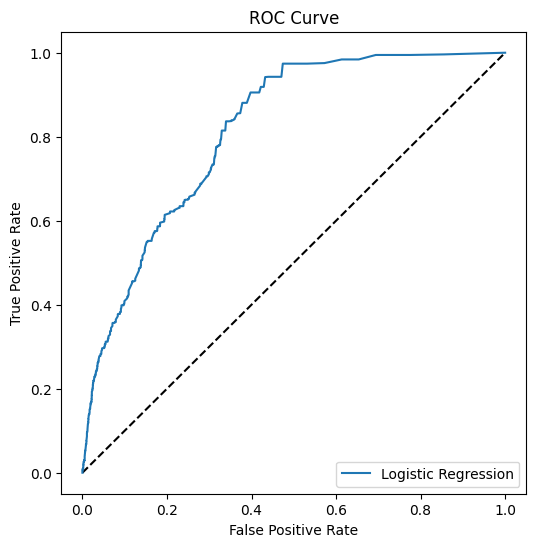

C:\Users\wista\AppData\Local\Temp\ipykernel_16624\2045065270.py:42: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  metrics_dataframe = pd.concat([metrics_dataframe, new_row], ignore_index=True)


,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493


In [19]:
calculate_metrics(model_lr, 'Logistic Regression', X_test_standardized, y_test)

C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


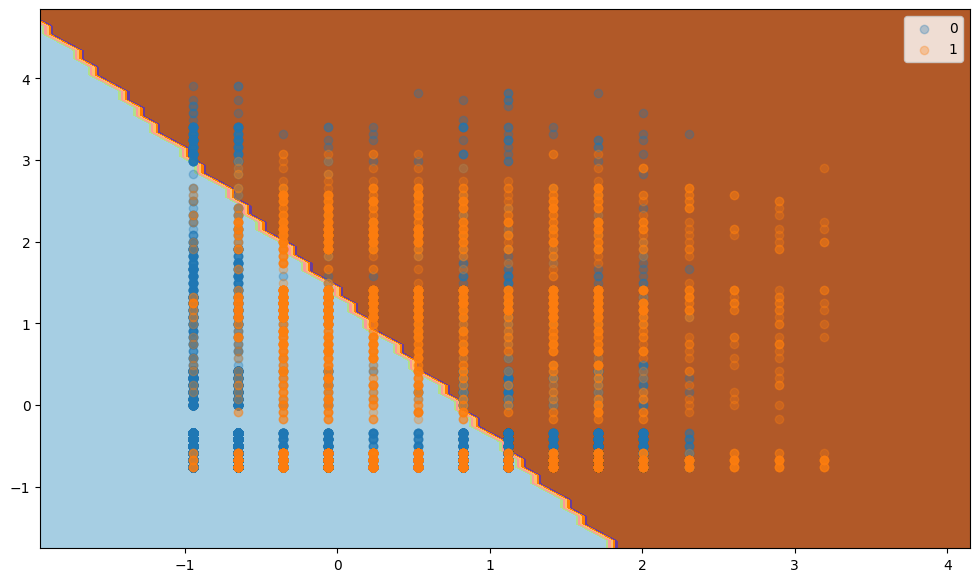

C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


F1 score (test): 0.5662650602409639
F1 score (train): 0.5383647798742138
Regularyzacja: l1, C=0.001



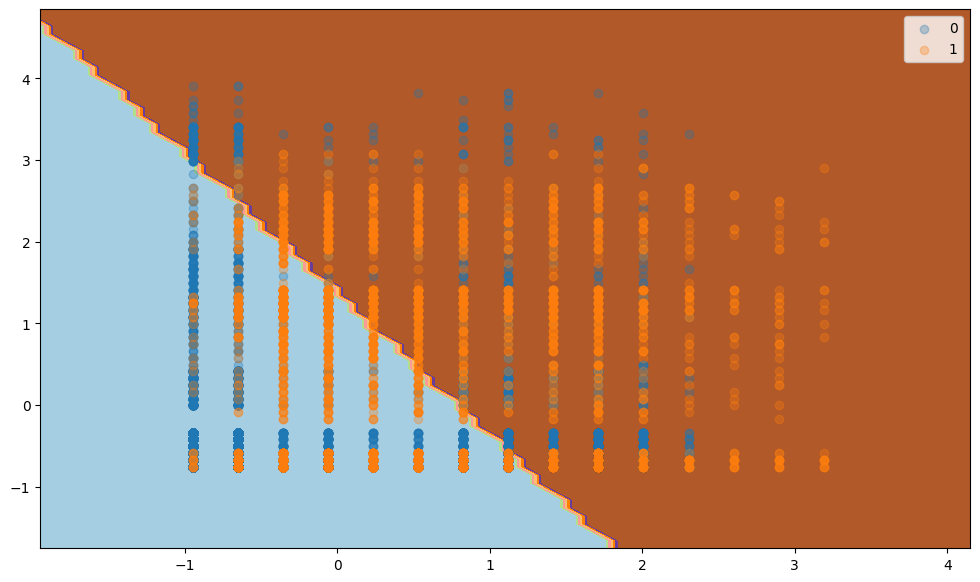

F1 score (test): 0.5662650602409639
F1 score (train): 0.5383647798742138
Regularyzacja: l1, C=0.001



C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


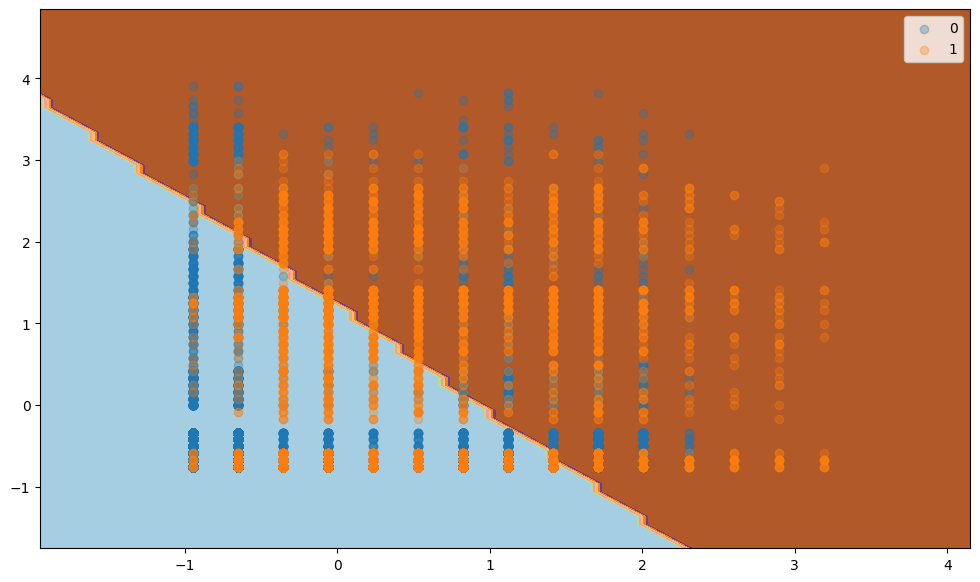

C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


F1 score (test): 0.5772893772893772
F1 score (train): 0.5464035230794324
Regularyzacja: l1, C=0.01



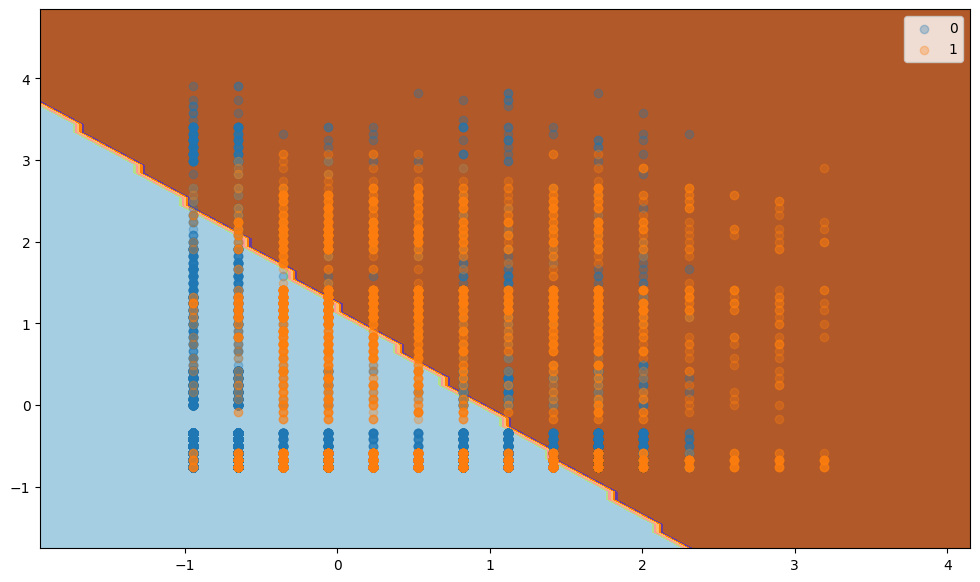

F1 score (test): 0.5809280233832663
F1 score (train): 0.5468775476928094
Regularyzacja: l1, C=0.1



C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


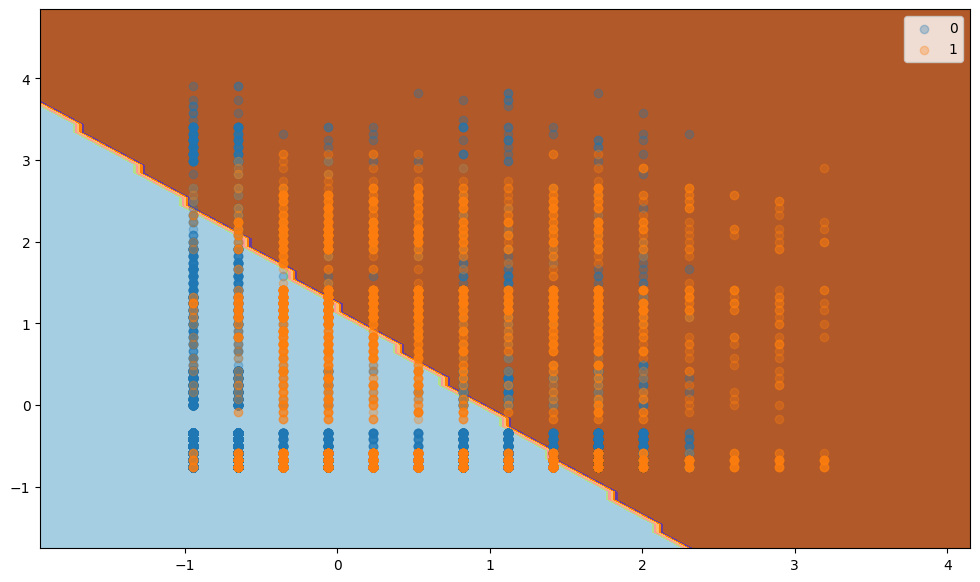

F1 score (test): 0.5809280233832663
F1 score (train): 0.5468775476928094
Regularyzacja: l1, C=1.0



C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


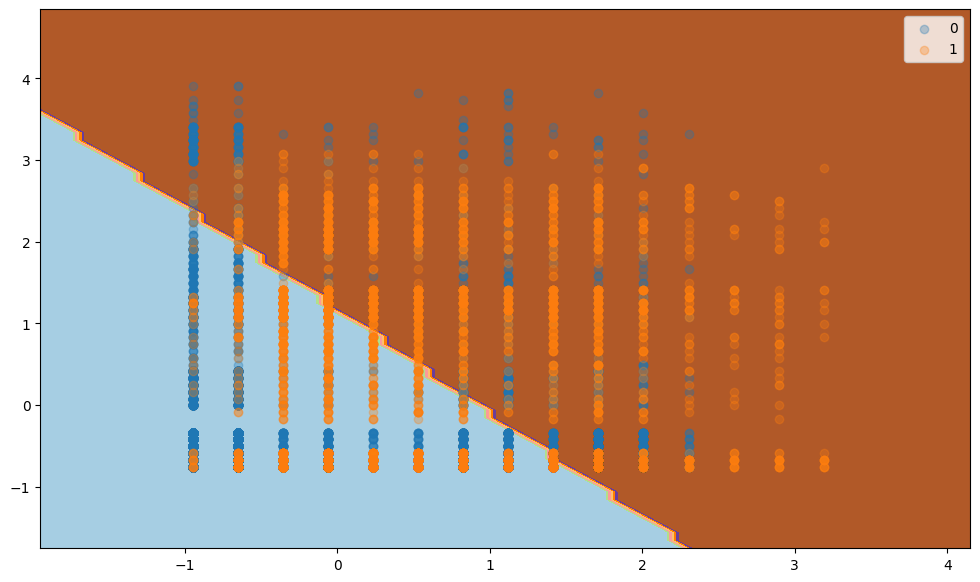

F1 score (test): 0.5845147219193021
F1 score (train): 0.5523840415180019
Regularyzacja: l2, C=0.001



C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


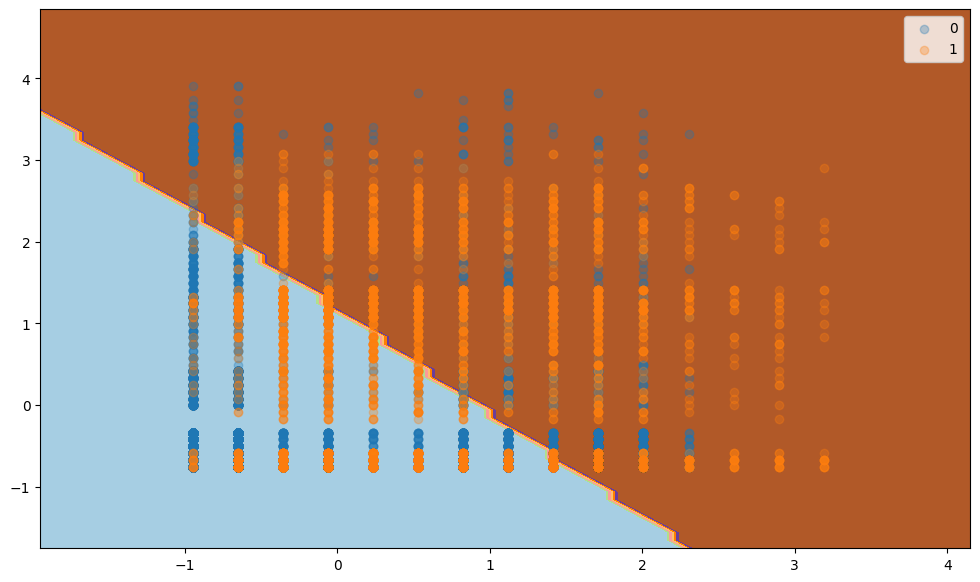

F1 score (test): 0.5845147219193021
F1 score (train): 0.5523840415180019
Regularyzacja: l2, C=0.001



C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


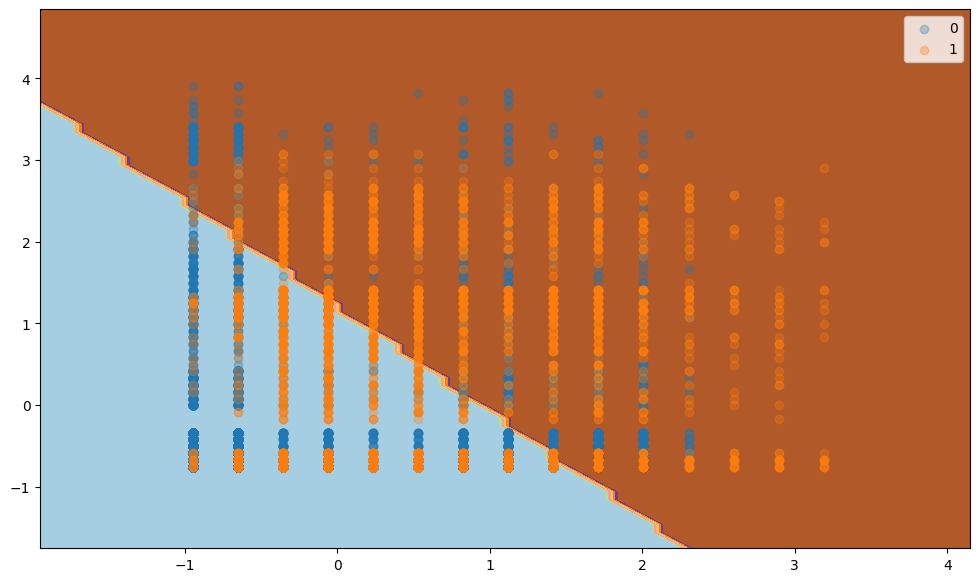

F1 score (test): 0.5809280233832663
F1 score (train): 0.5468775476928094
Regularyzacja: l2, C=0.01



C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


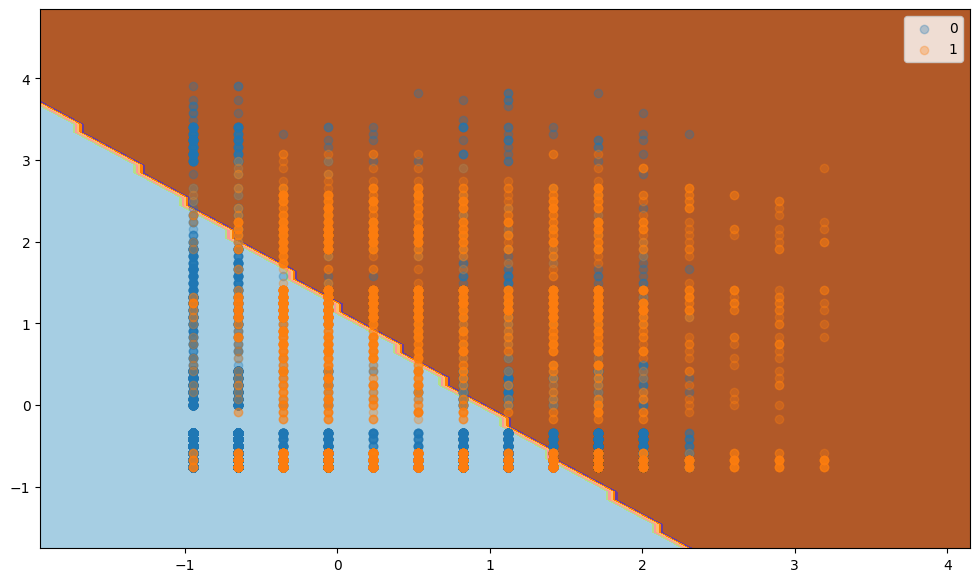

F1 score (test): 0.5809280233832663
F1 score (train): 0.5468775476928094
Regularyzacja: l2, C=0.1



C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


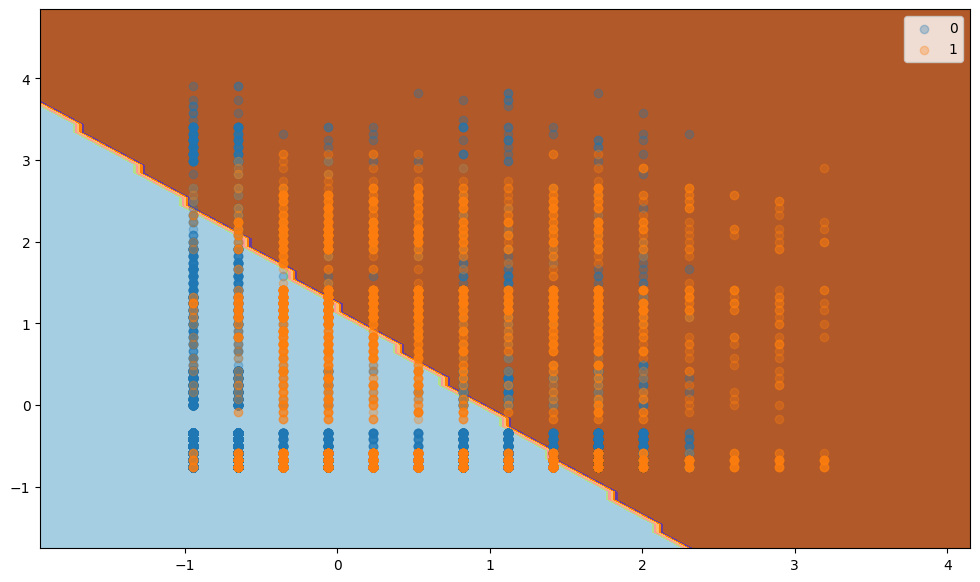

F1 score (test): 0.5809280233832663
F1 score (train): 0.5468775476928094
Regularyzacja: l2, C=1.0



In [20]:
# Lista parametrów do przetestowania
C_values = [0.001,0.001, 0.01, 0.1, 1.0]
penalties = ['l1', 'l2']

scaler_2var = StandardScaler()
X_train_standardized = scaler_2var.fit_transform(X_train)
X_test_standardized = scaler_2var.transform(X_test)
# model_lr = LogisticRegression(penalty=None, solver='lbfgs')
# model_lr.fit(X_train_standardized, y_train)

# plot_classification_surface(X_plot=X_train_standardized, y_plot=y_train, trained_model=model_lr)


for i, penalty in enumerate(penalties):
    for j, C in enumerate(C_values):
        # Trenowanie modelu
        model = LogisticRegression(penalty=penalty, C=C, solver='liblinear')
        model.fit(X_train_standardized, y_train)

        # Rysowanie powierzchni decyzyjnej
        plot_classification_surface(X_plot=X_train_standardized, y_plot=y_train, 
                                 trained_model=model)
        # print(classification_report(y_test, model.predict(X_test_standardized)))
        print(f'F1 score (test): {f1_score(y_test, model.predict(X_test_standardized))}')
        print(f'F1 score (train): {f1_score(y_train, model.predict(X_train_standardized))}')
        print(f'Regularyzacja: {penalty}, C={C}\n')

C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


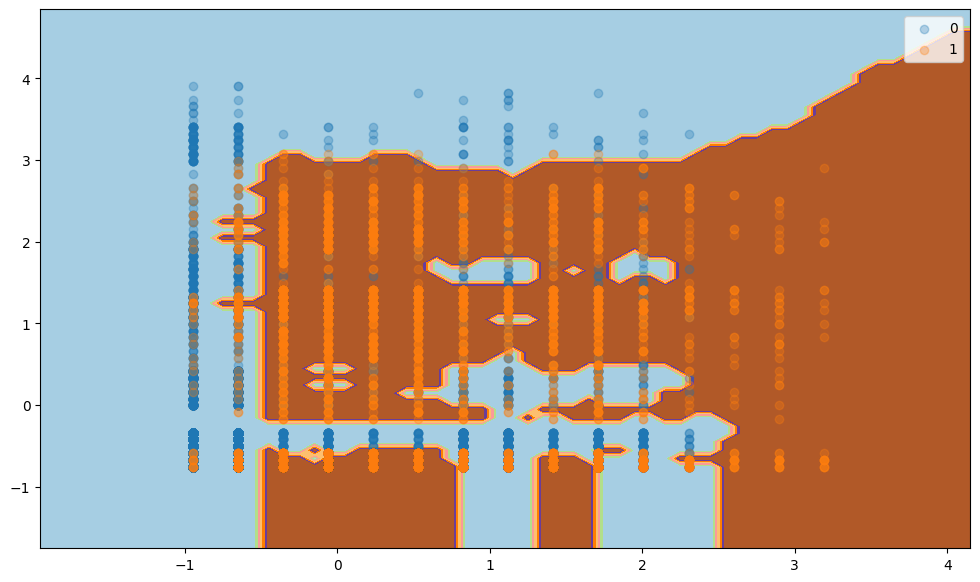

In [21]:
from sklearn.neighbors import KNeighborsClassifier

model_knn = KNeighborsClassifier(n_neighbors= int(X_train_standardized.shape[0]*0.001))
model_knn.fit(X_train_standardized, y_train)
plot_classification_surface(X_plot=X_train_standardized, y_plot=y_train, trained_model=model_knn)

              precision    recall  f1-score   support

           0       0.90      0.91      0.91      3000
           1       0.82      0.80      0.81      1500

    accuracy                           0.87      4500
   macro avg       0.86      0.85      0.86      4500
weighted avg       0.87      0.87      0.87      4500



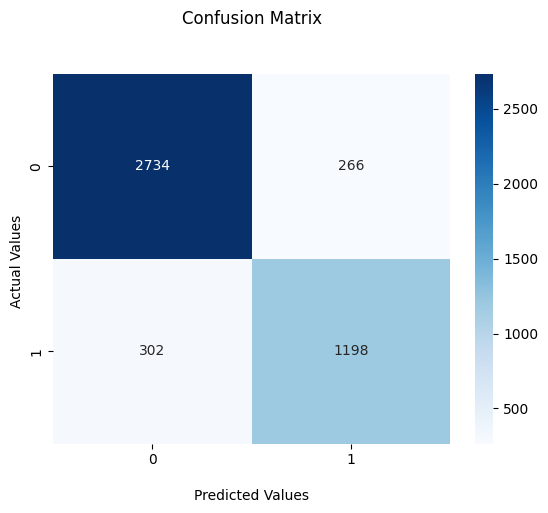

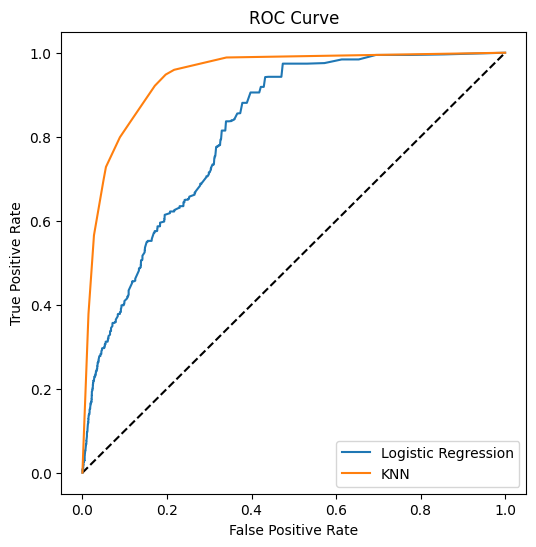

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593


In [22]:
calculate_metrics(model_knn, 'KNN', X_test_standardized, y_test )

C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


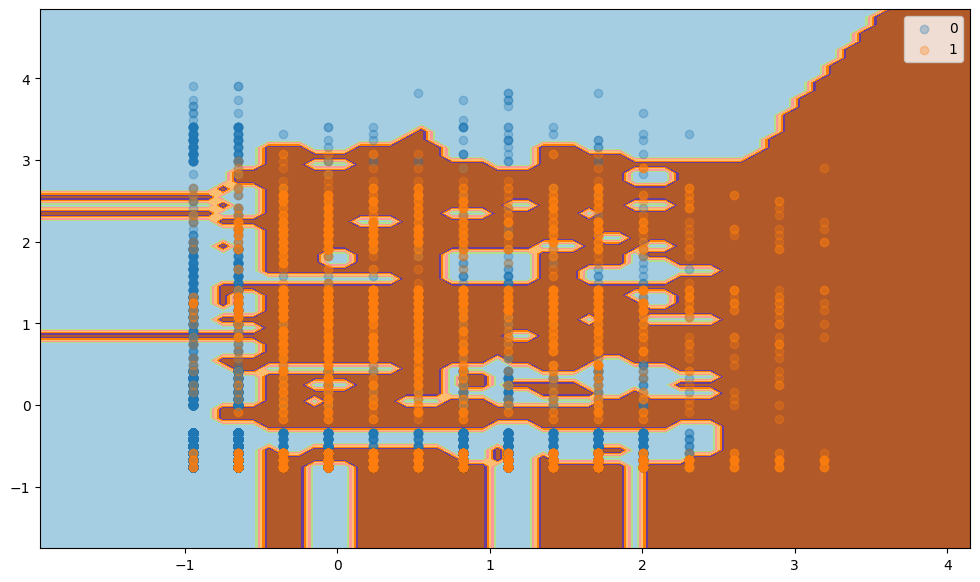

K: 1
              precision    recall  f1-score   support

           0       0.91      0.86      0.88      3000
           1       0.75      0.82      0.78      1500

    accuracy                           0.85      4500
   macro avg       0.83      0.84      0.83      4500
weighted avg       0.85      0.85      0.85      4500

--------------------------------


C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


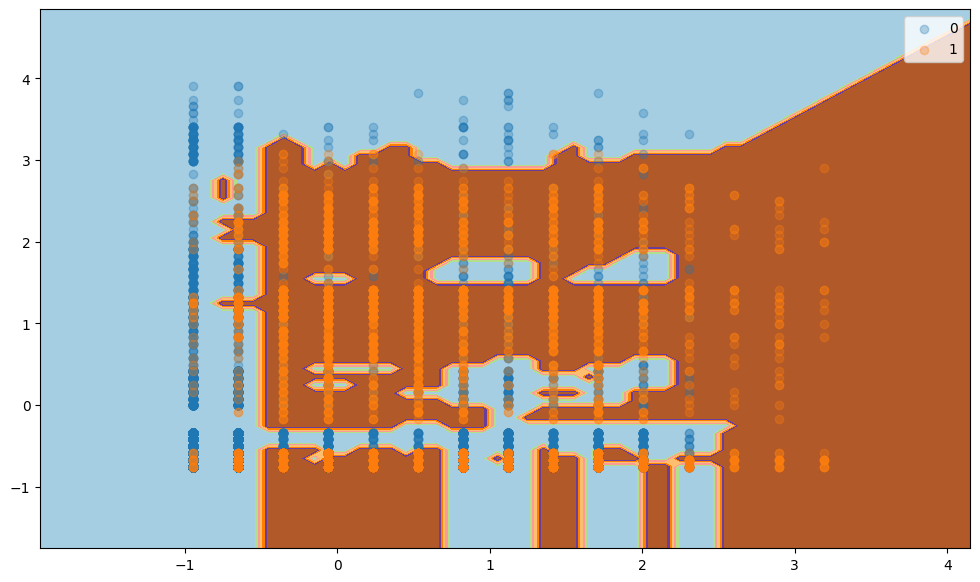

K: 5
              precision    recall  f1-score   support

           0       0.90      0.91      0.90      3000
           1       0.81      0.79      0.80      1500

    accuracy                           0.87      4500
   macro avg       0.85      0.85      0.85      4500
weighted avg       0.87      0.87      0.87      4500

--------------------------------


C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


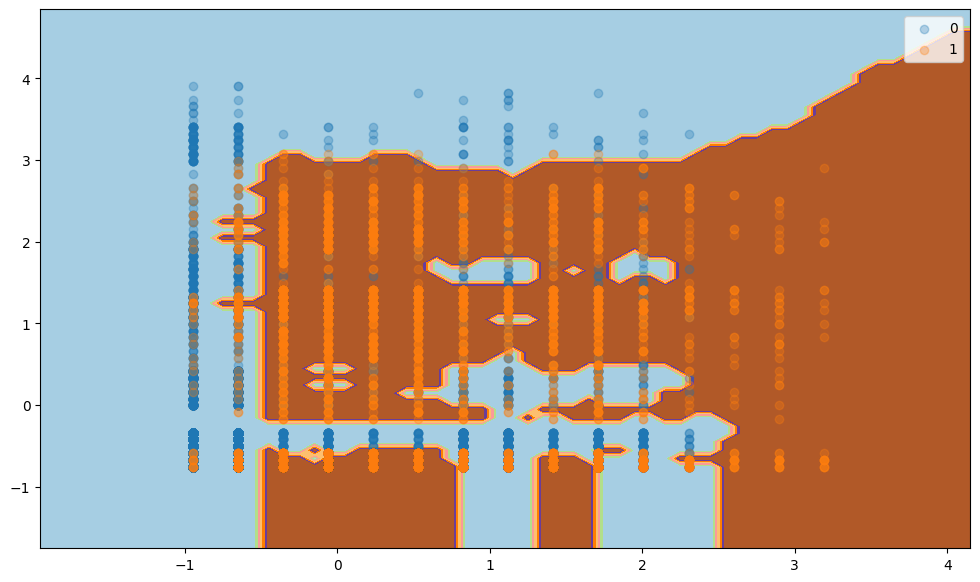

K: 10
              precision    recall  f1-score   support

           0       0.90      0.91      0.91      3000
           1       0.82      0.80      0.81      1500

    accuracy                           0.87      4500
   macro avg       0.86      0.85      0.86      4500
weighted avg       0.87      0.87      0.87      4500

--------------------------------


C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


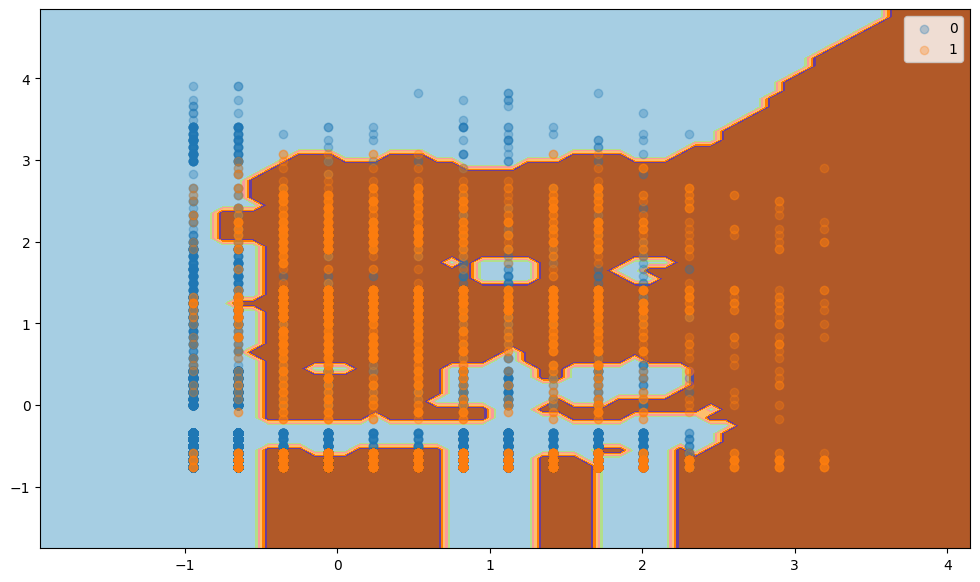

K: 20
              precision    recall  f1-score   support

           0       0.90      0.92      0.91      3000
           1       0.83      0.79      0.81      1500

    accuracy                           0.88      4500
   macro avg       0.86      0.85      0.86      4500
weighted avg       0.87      0.88      0.87      4500

--------------------------------


C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


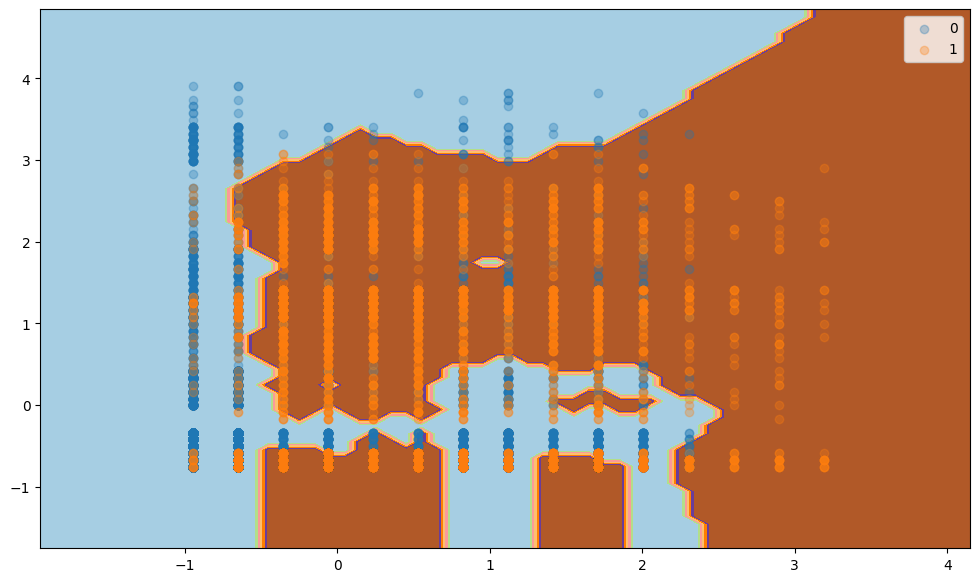

K: 50
              precision    recall  f1-score   support

           0       0.92      0.89      0.90      3000
           1       0.79      0.85      0.82      1500

    accuracy                           0.88      4500
   macro avg       0.86      0.87      0.86      4500
weighted avg       0.88      0.88      0.88      4500

--------------------------------


C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


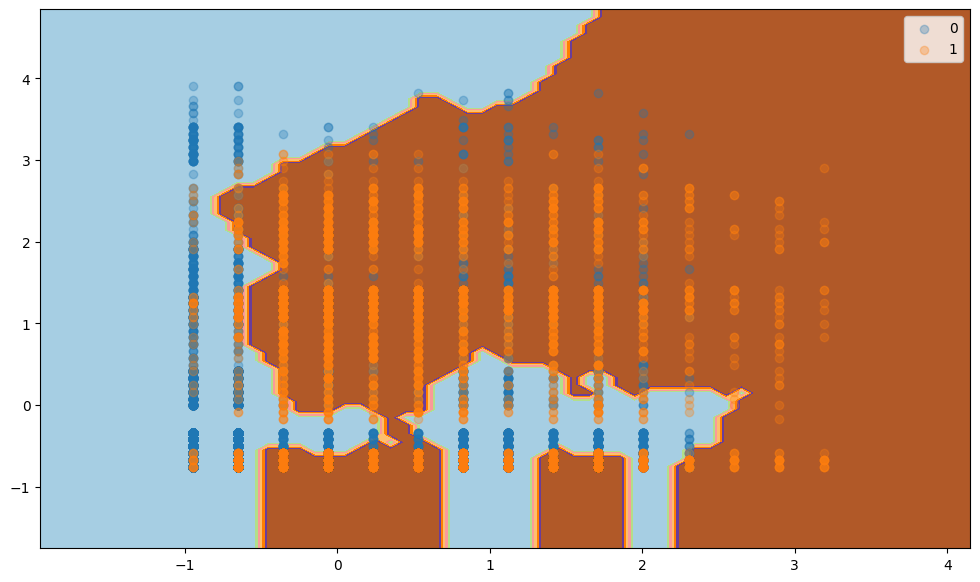

K: 100
              precision    recall  f1-score   support

           0       0.91      0.89      0.90      3000
           1       0.79      0.83      0.81      1500

    accuracy                           0.87      4500
   macro avg       0.85      0.86      0.86      4500
weighted avg       0.87      0.87      0.87      4500

--------------------------------


In [23]:
K_params = [1,5,10,20,50,100]
for k in K_params:
    model_knn = KNeighborsClassifier(n_neighbors=k, metric='euclidean')
    model_knn.fit(X_train_standardized, y_train)
    plot_classification_surface(X_plot=X_train_standardized, y_plot=y_train, trained_model=model_knn)
    print(f"K: {k}")
    print(classification_report(y_test, model_knn.predict(X_test_standardized)))
    print("--------------------------------")

c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


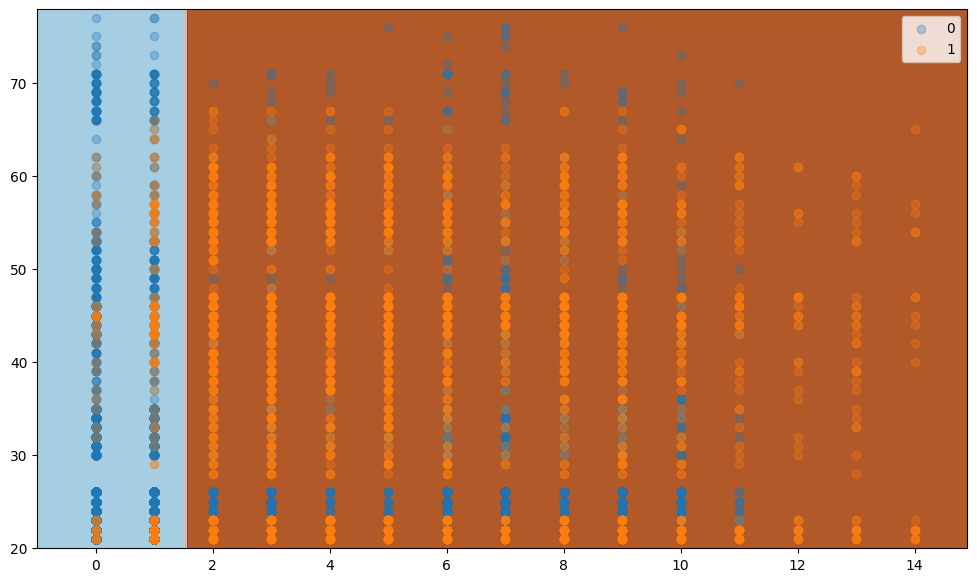

c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


Min samples leaf: 0.001, Max depth: 1, F1 score (test): 0.739


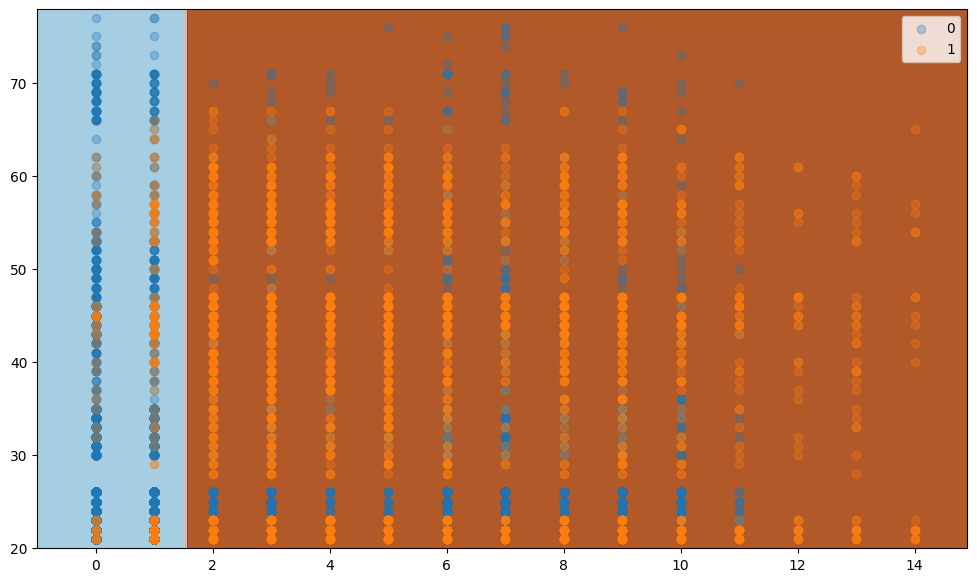

Min samples leaf: 0.005, Max depth: 1, F1 score (test): 0.739


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


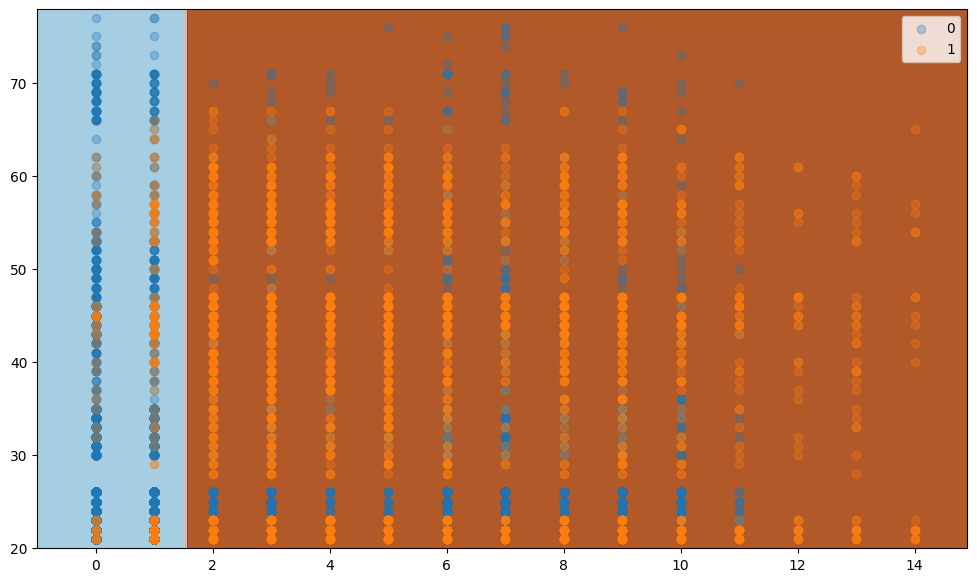

Min samples leaf: 0.0001, Max depth: 1, F1 score (test): 0.739


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


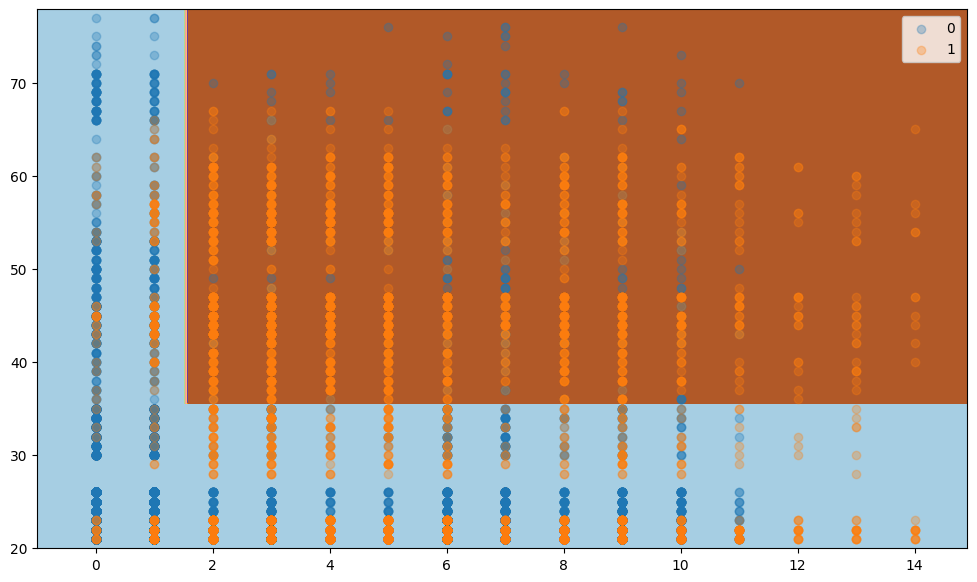

Min samples leaf: 0.001, Max depth: 2, F1 score (test): 0.642


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


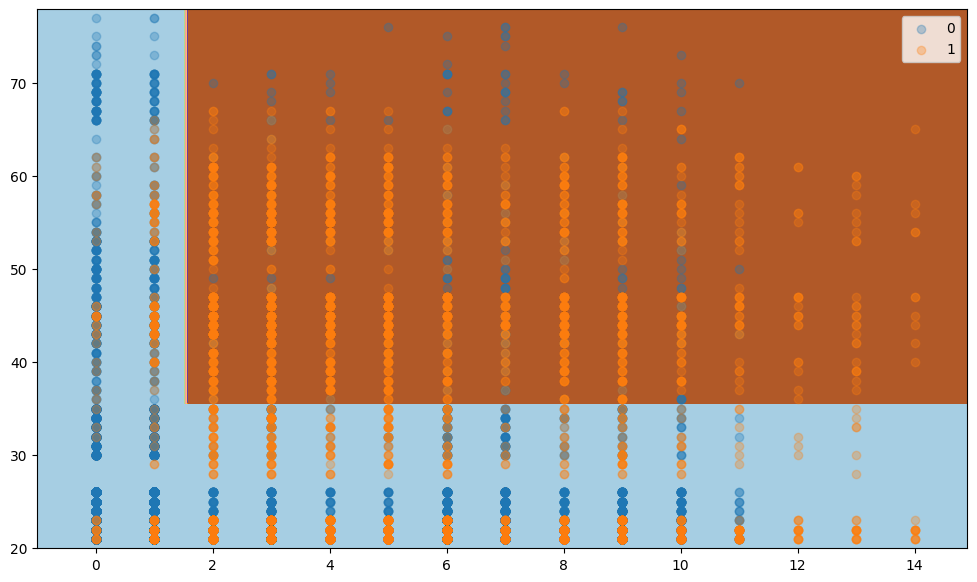

Min samples leaf: 0.005, Max depth: 2, F1 score (test): 0.642


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


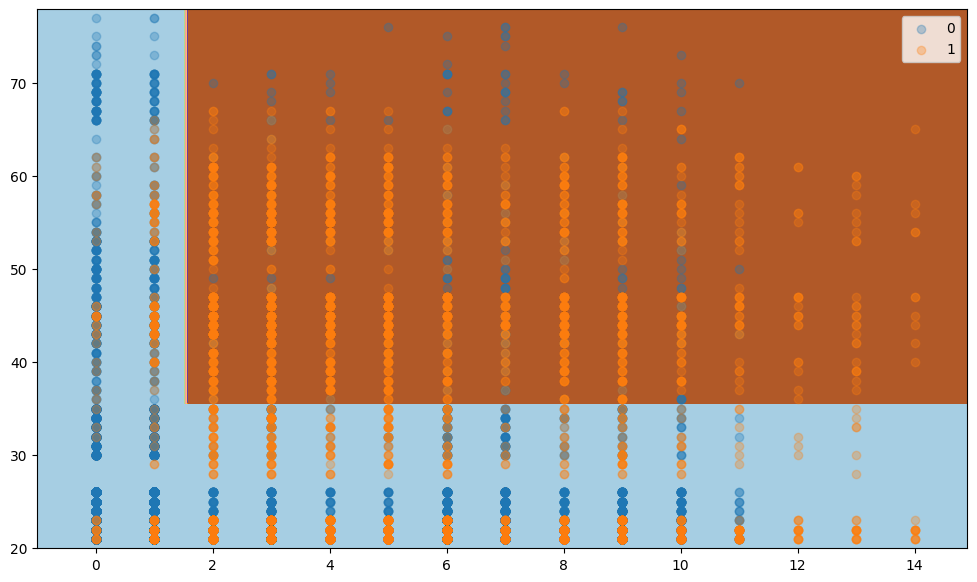

Min samples leaf: 0.0001, Max depth: 2, F1 score (test): 0.642


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


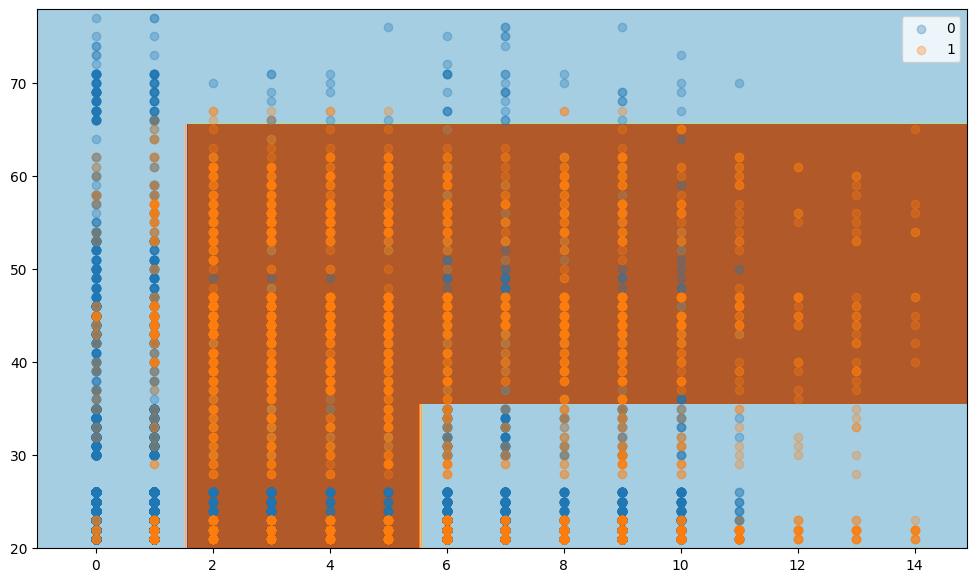

Min samples leaf: 0.001, Max depth: 3, F1 score (test): 0.780


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


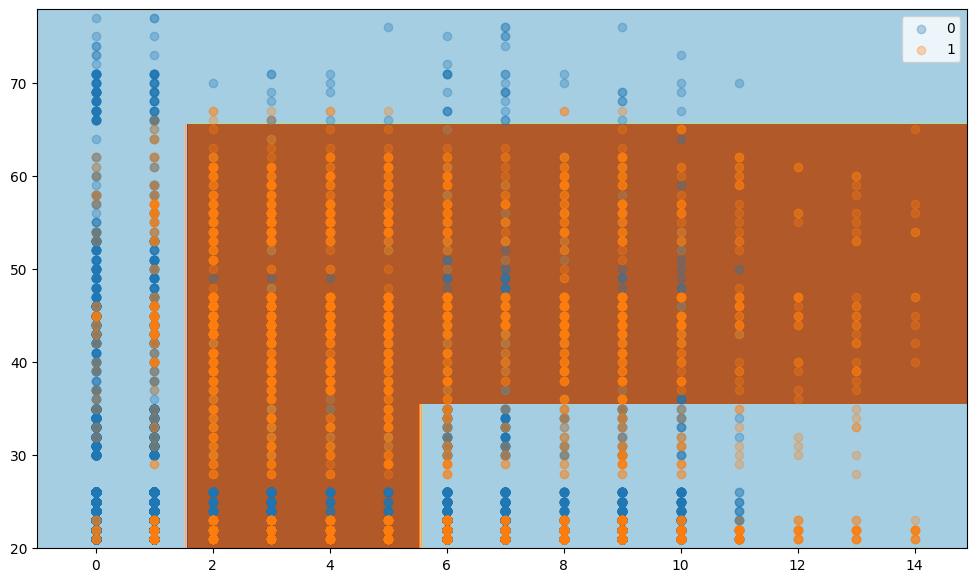

Min samples leaf: 0.005, Max depth: 3, F1 score (test): 0.780


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


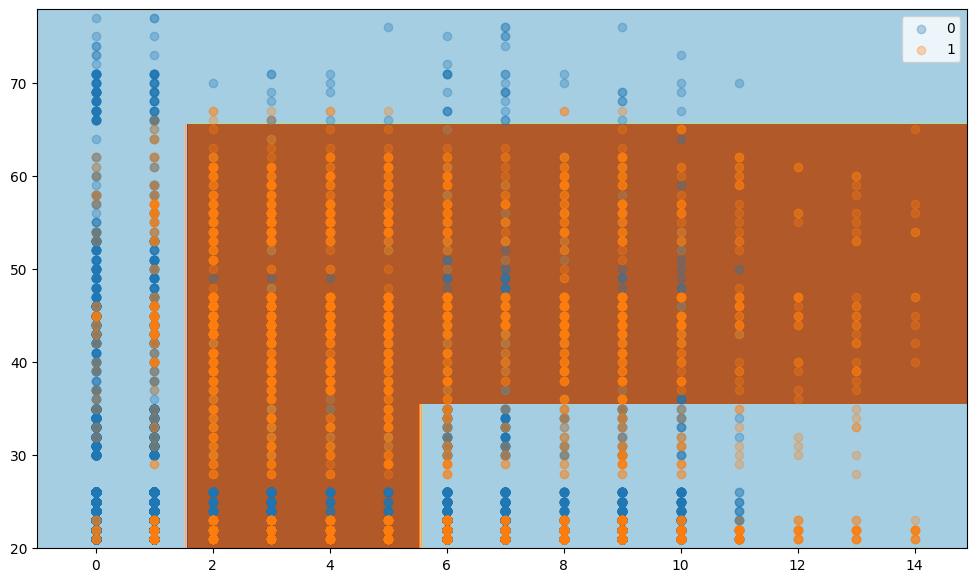

Min samples leaf: 0.0001, Max depth: 3, F1 score (test): 0.780


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


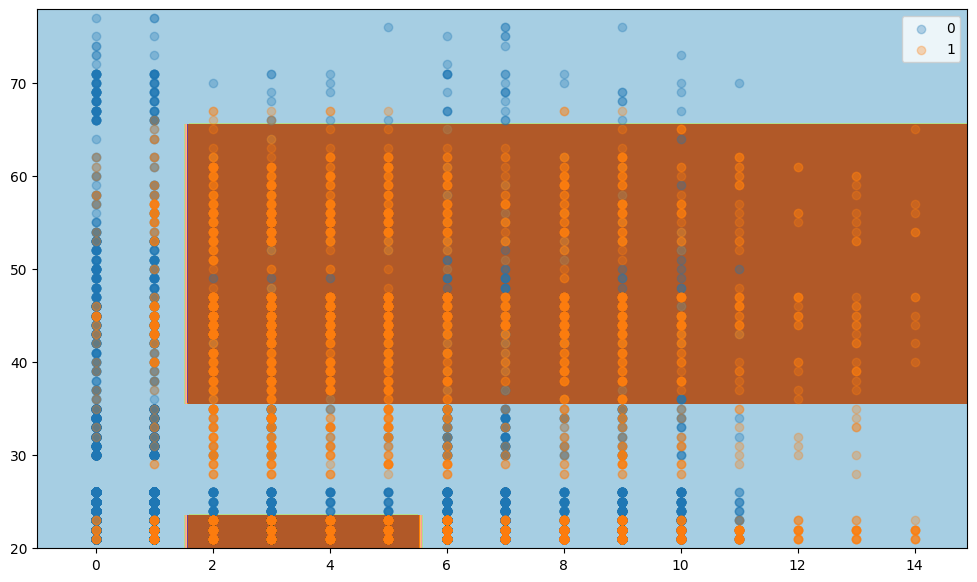

Min samples leaf: 0.001, Max depth: 4, F1 score (test): 0.777


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


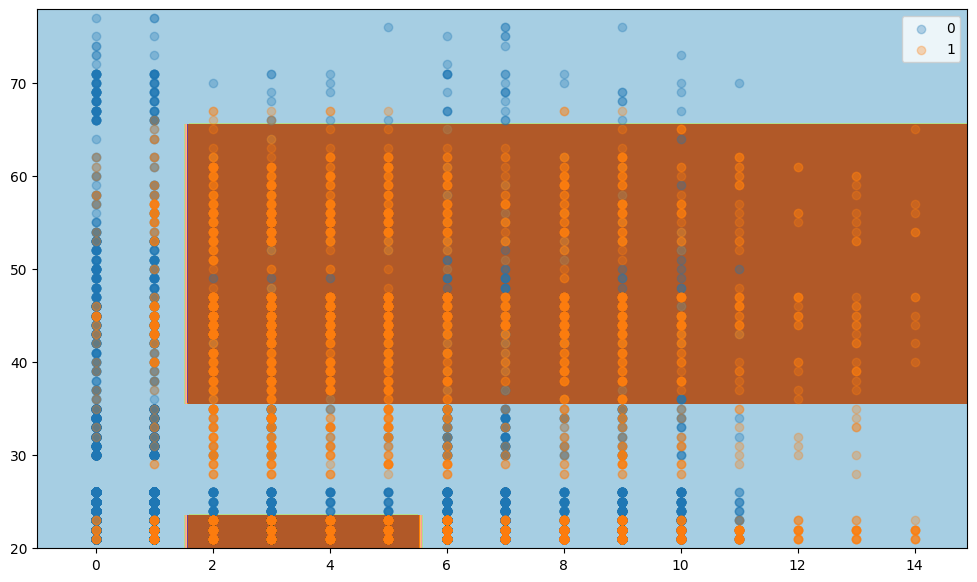

Min samples leaf: 0.005, Max depth: 4, F1 score (test): 0.777


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


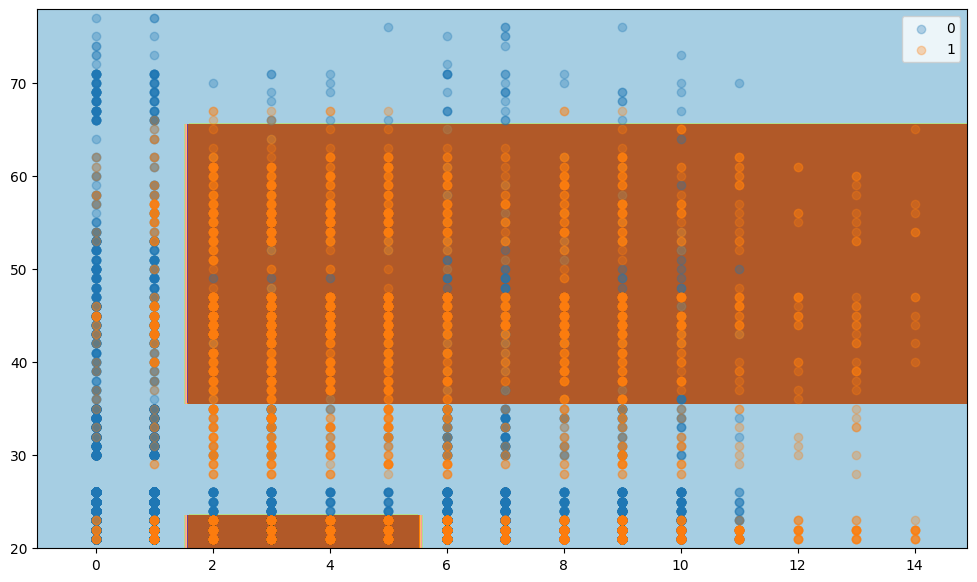

Min samples leaf: 0.0001, Max depth: 4, F1 score (test): 0.777


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


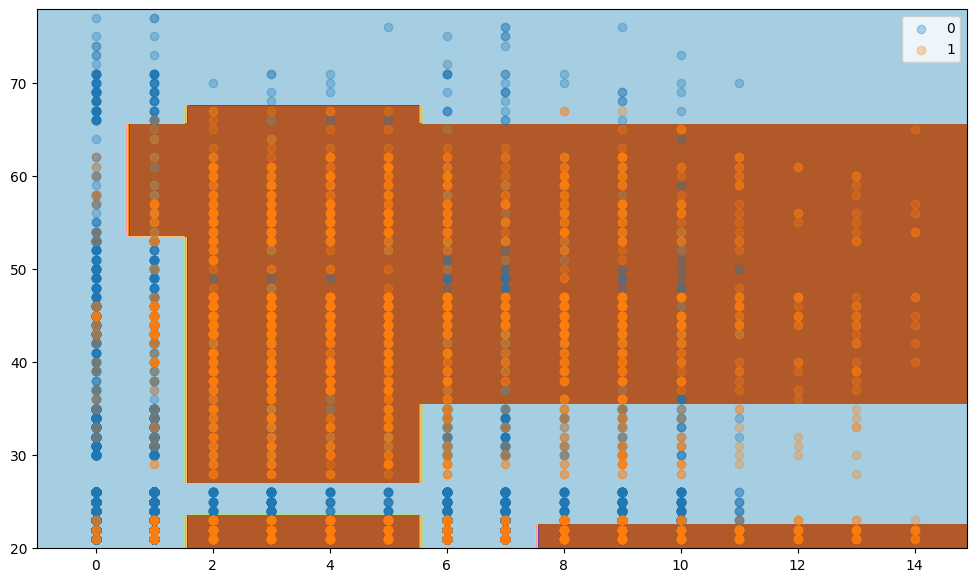

Min samples leaf: 0.001, Max depth: 5, F1 score (test): 0.823


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


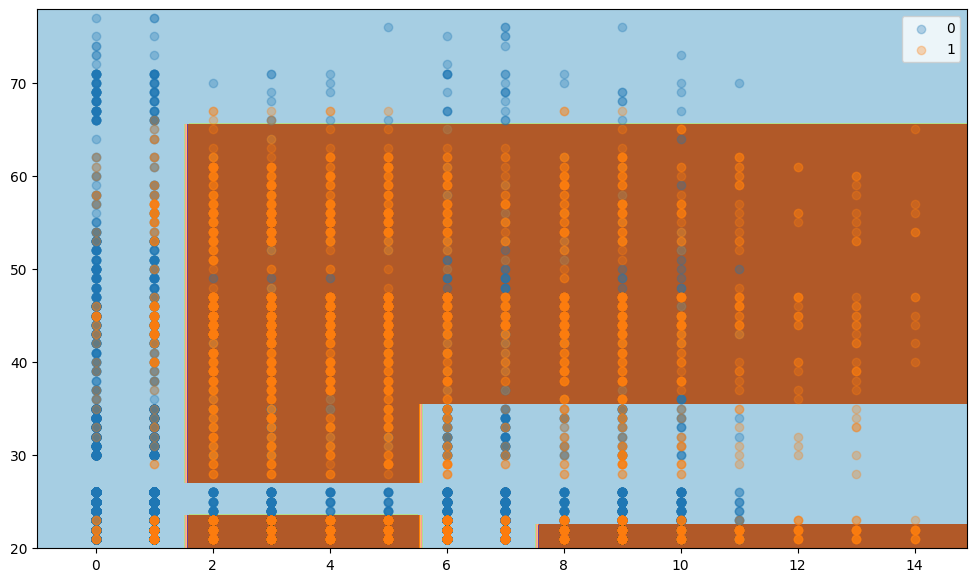

Min samples leaf: 0.005, Max depth: 5, F1 score (test): 0.822


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


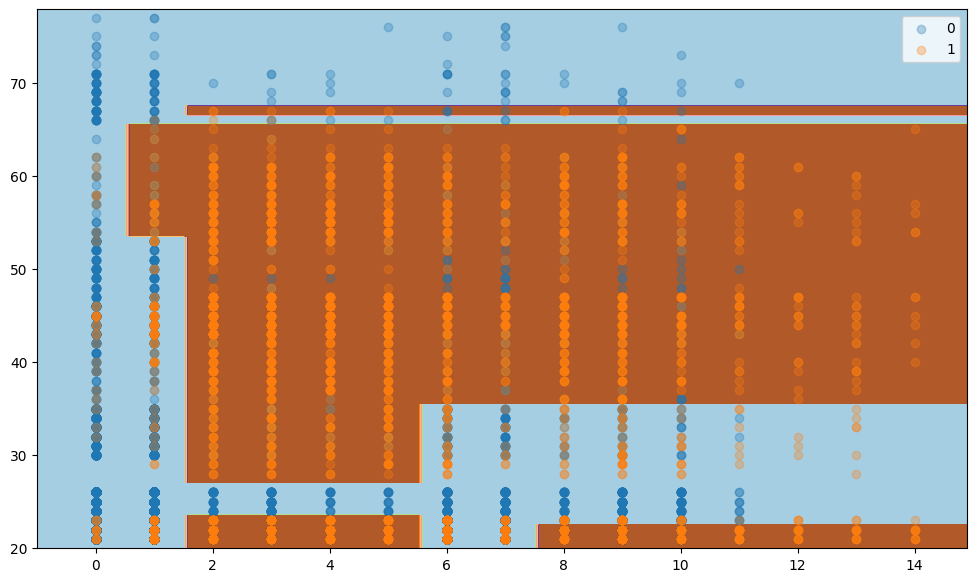

Min samples leaf: 0.0001, Max depth: 5, F1 score (test): 0.821


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


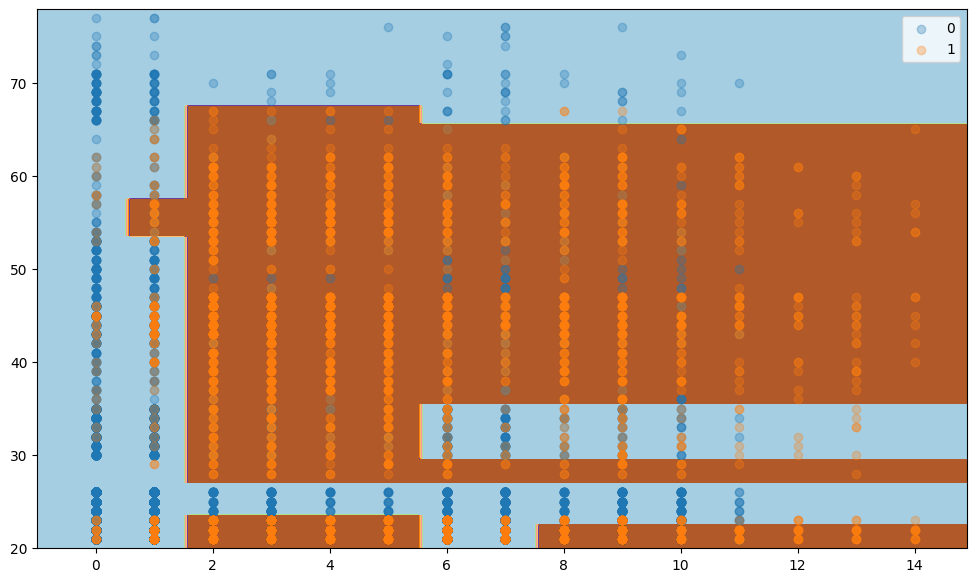

c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


Min samples leaf: 0.001, Max depth: 6, F1 score (test): 0.826


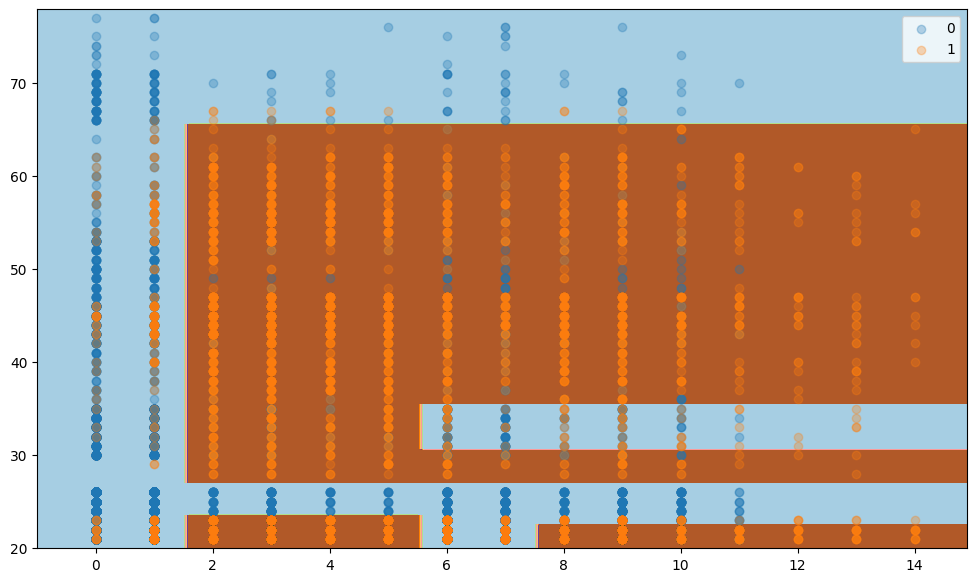

Min samples leaf: 0.005, Max depth: 6, F1 score (test): 0.823


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


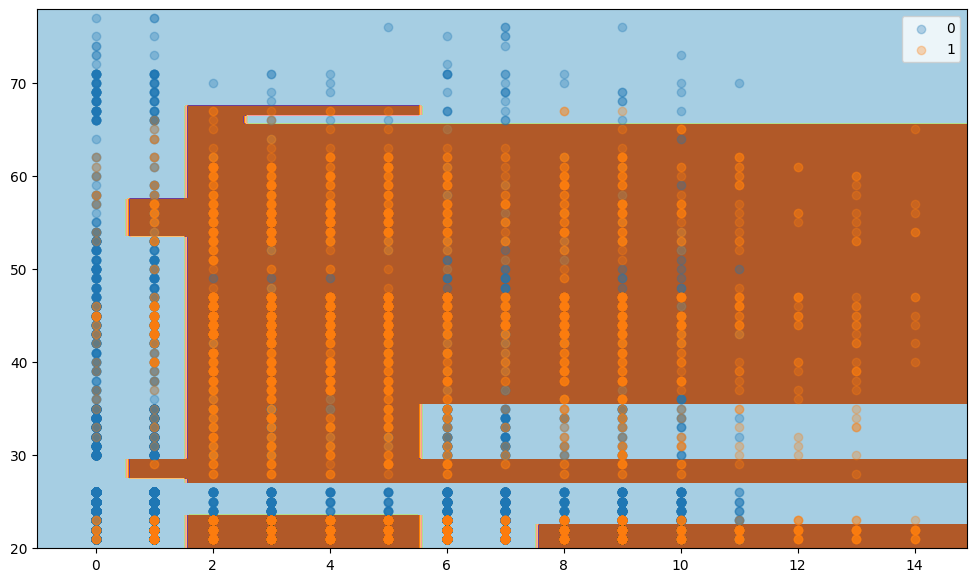

Min samples leaf: 0.0001, Max depth: 6, F1 score (test): 0.825
    min_samples_leaf  max_depth  f1_score
0             0.0010          1  0.738814
1             0.0050          1  0.738814
2             0.0001          1  0.738814
3             0.0010          2  0.642038
4             0.0050          2  0.642038
5             0.0001          2  0.642038
6             0.0010          3  0.780021
7             0.0050          3  0.780021
8             0.0001          3  0.780021
9             0.0010          4  0.777258
10            0.0050          4  0.777258
11            0.0001          4  0.777258
12            0.0010          5  0.822927
13            0.0050          5  0.822201
14            0.0001          5  0.821268
15            0.0010          6  0.826017
16            0.0050          6  0.823190
17            0.0001          6  0.825265


In [24]:
import numpy as np
from sklearn.tree import DecisionTreeClassifier
results = []
max_depth = [1, 2, 3, 4, 5, 6]
for depth in max_depth:
  min_samples_leaf = [0.001, 0.005, 0.0001]
  for leaf in min_samples_leaf:
      model_tree = DecisionTreeClassifier(max_depth=depth, min_samples_leaf=int(X_train.shape[0]*leaf))
      model_tree.fit(X_train, y_train)
      predictions = model_tree.predict(X_test)
      results.append({'min_samples_leaf': leaf, 'max_depth': depth, 'f1_score': f1_score(y_test, predictions)})
      plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_tree)
      print(f'Min samples leaf: {leaf}, Max depth: {depth}, F1 score (test): {f1_score(y_test, predictions):.3f}')
print(pd.DataFrame(results))

c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable

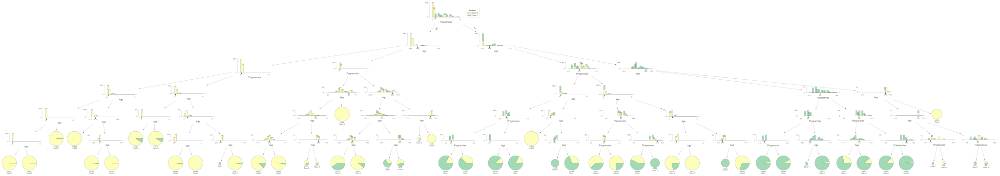

In [25]:

import dtreeviz

viz = dtreeviz.model(
    model_tree,
    X_train,
    y_train,
    target_name='Diabetic',
    feature_names=X_train.columns,
)
viz.view()

c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


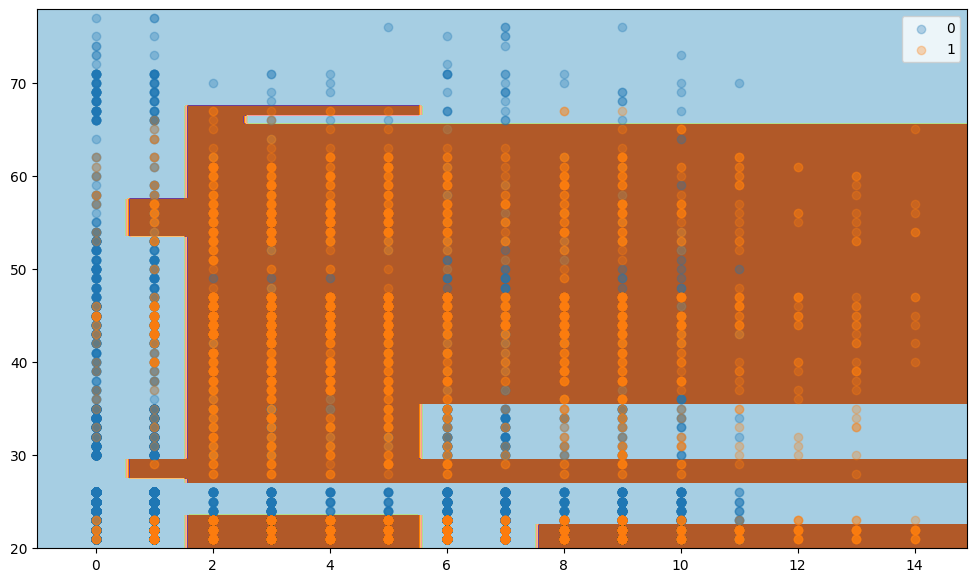

In [26]:
import numpy as np

plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_tree)

              precision    recall  f1-score   support

           0       0.93      0.89      0.91      3000
           1       0.79      0.86      0.83      1500

    accuracy                           0.88      4500
   macro avg       0.86      0.87      0.87      4500
weighted avg       0.88      0.88      0.88      4500



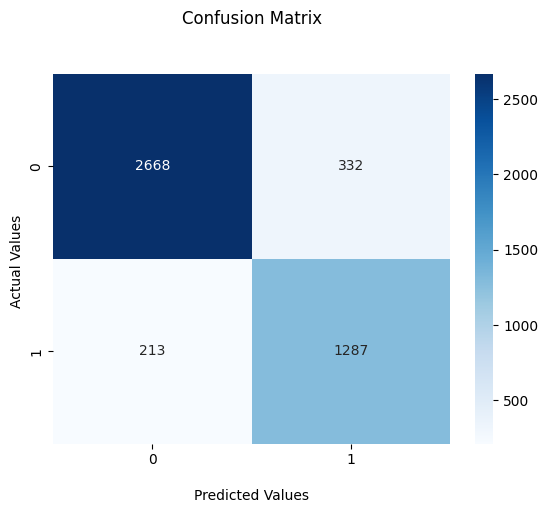

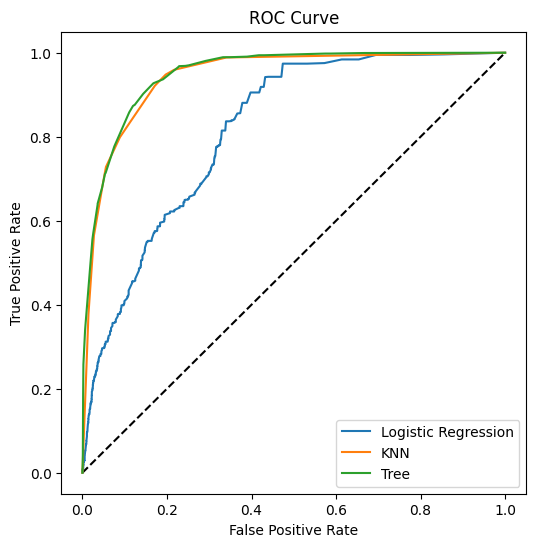

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593
2,Tree,0.825265,0.949433


In [27]:
calculate_metrics(model_tree, 'Tree', X_test, y_test)

C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


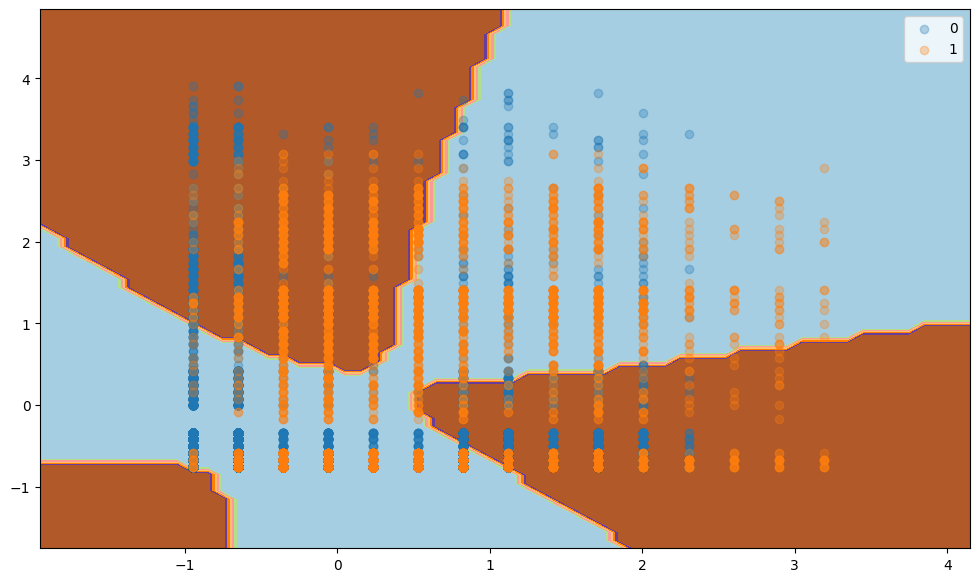

In [28]:
from sklearn.svm import SVC

model_svm = SVC(kernel='sigmoid', probability=True, C=1, gamma=0.5)
model_svm.fit(X_train_standardized, y_train)
plot_classification_surface(X_plot=X_train_standardized, y_plot=y_train, trained_model=model_svm)

c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but SVC was fitted without feature names
c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but SVC was fitted without feature names


              precision    recall  f1-score   support

           0       0.63      0.11      0.19      3000
           1       0.33      0.87      0.48      1500

    accuracy                           0.37      4500
   macro avg       0.48      0.49      0.34      4500
weighted avg       0.53      0.37      0.29      4500



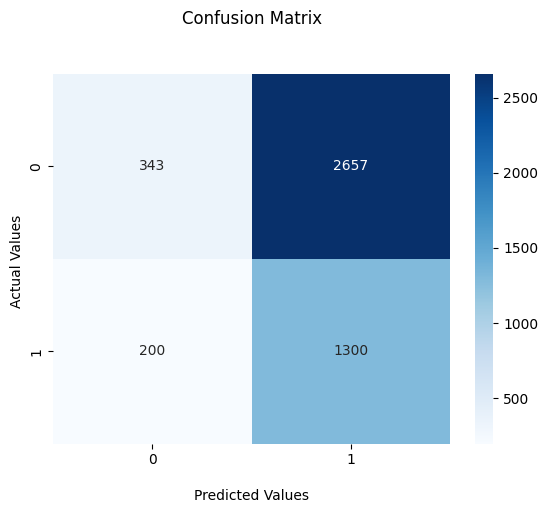

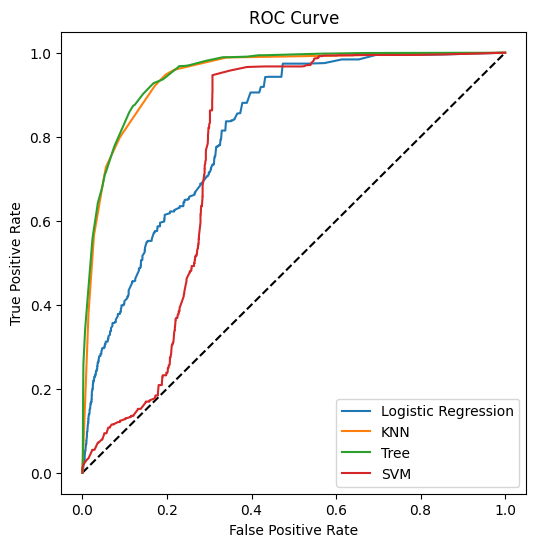

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593
2,Tree,0.825265,0.949433
3,SVM,0.476452,0.761497


In [29]:
calculate_metrics(model_svm, 'SVM', X_test, y_test)

c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


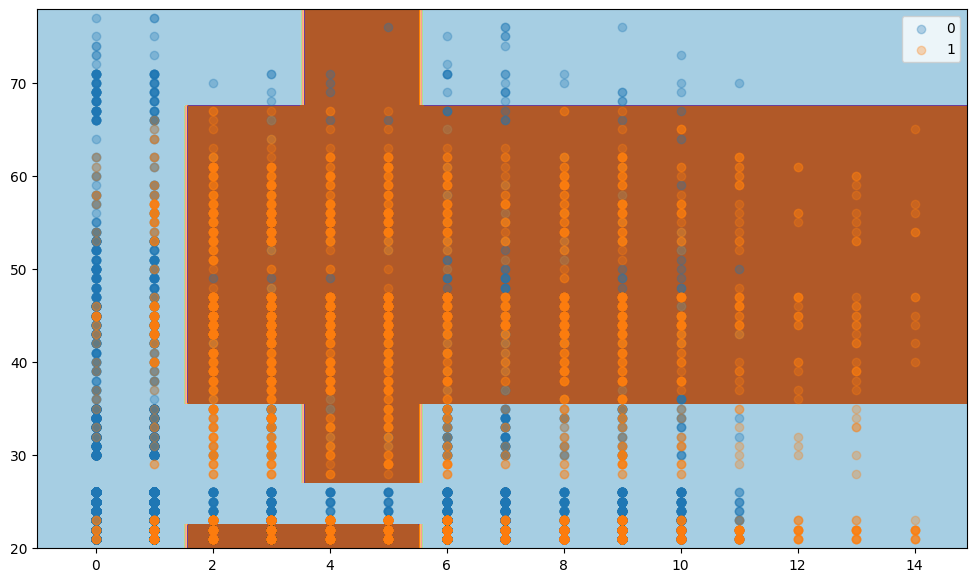

In [30]:
from sklearn.ensemble import RandomForestClassifier

model_forest = RandomForestClassifier(n_estimators=1000, max_depth=3, min_samples_leaf=int(X_train.shape[0]*0.001))
model_forest.fit(X_train, y_train)
plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_forest)

              precision    recall  f1-score   support

           0       0.86      0.94      0.90      3000
           1       0.86      0.70      0.77      1500

    accuracy                           0.86      4500
   macro avg       0.86      0.82      0.83      4500
weighted avg       0.86      0.86      0.86      4500



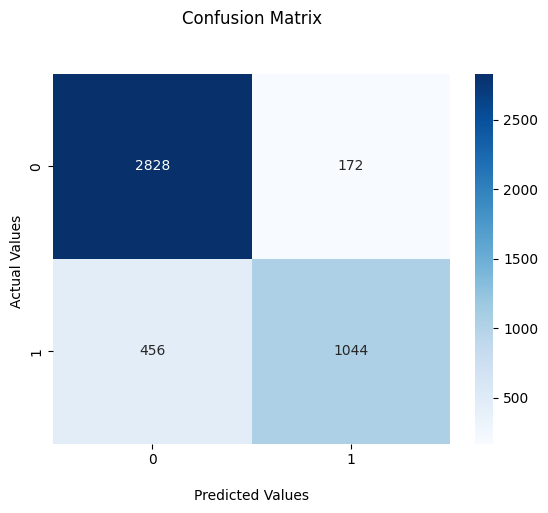

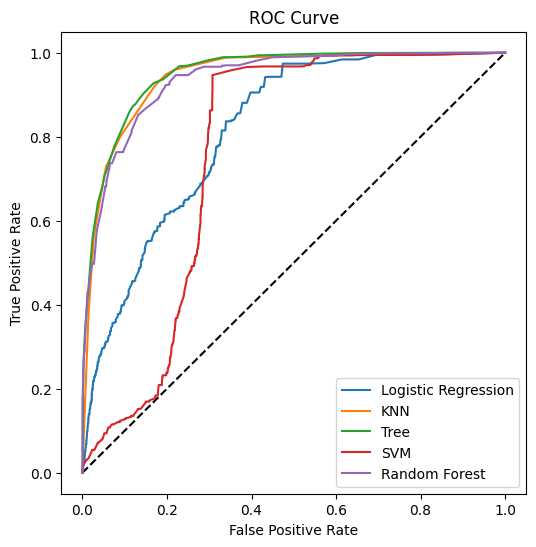

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593
2,Tree,0.825265,0.949433
3,SVM,0.476452,0.761497
4,Random Forest,0.768778,0.936785


In [31]:
calculate_metrics(model_forest, 'Random Forest', X_test, y_test)

c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


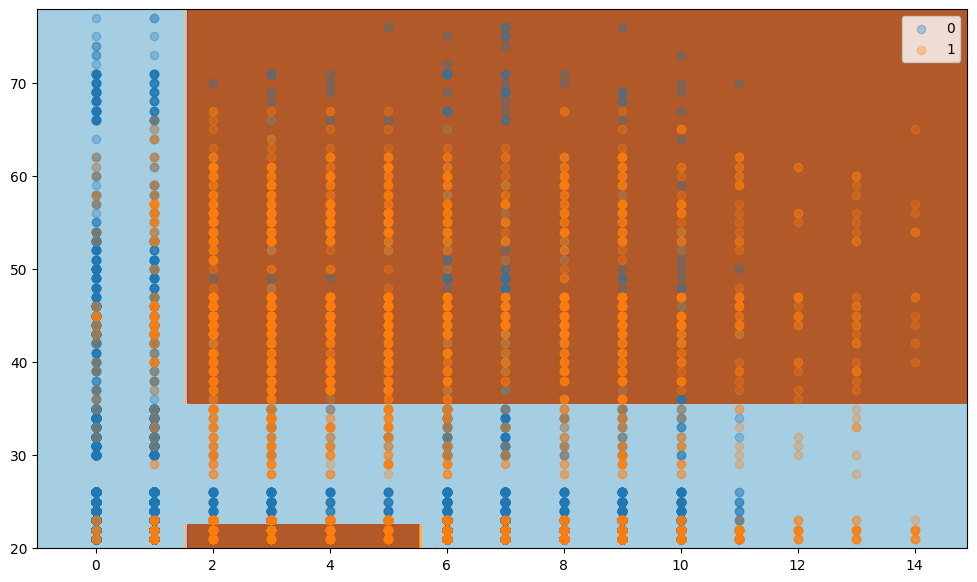

Max depth: 3, F1 score (test): 0.757


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


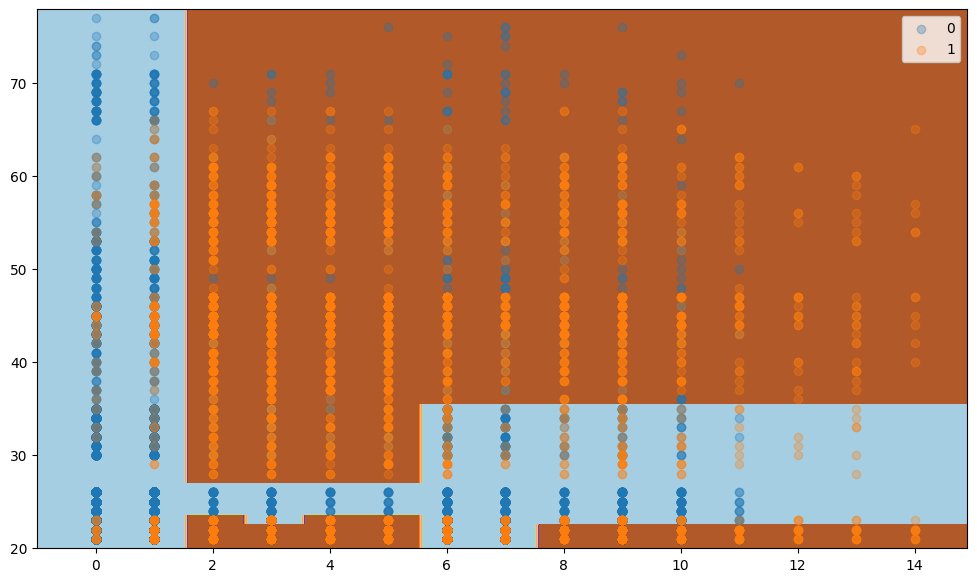

Max depth: 6, F1 score (test): 0.818


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


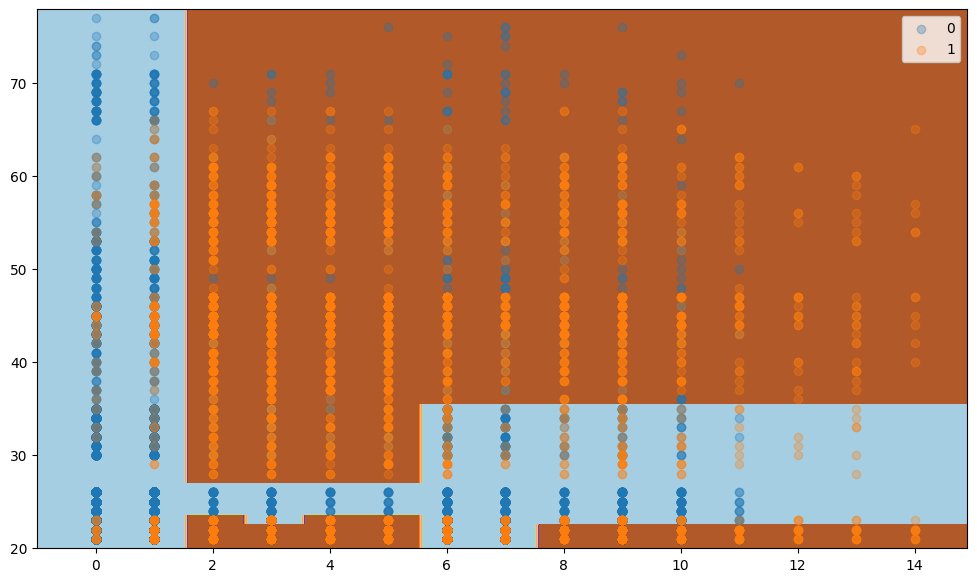

Max depth: 9, F1 score (test): 0.818


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


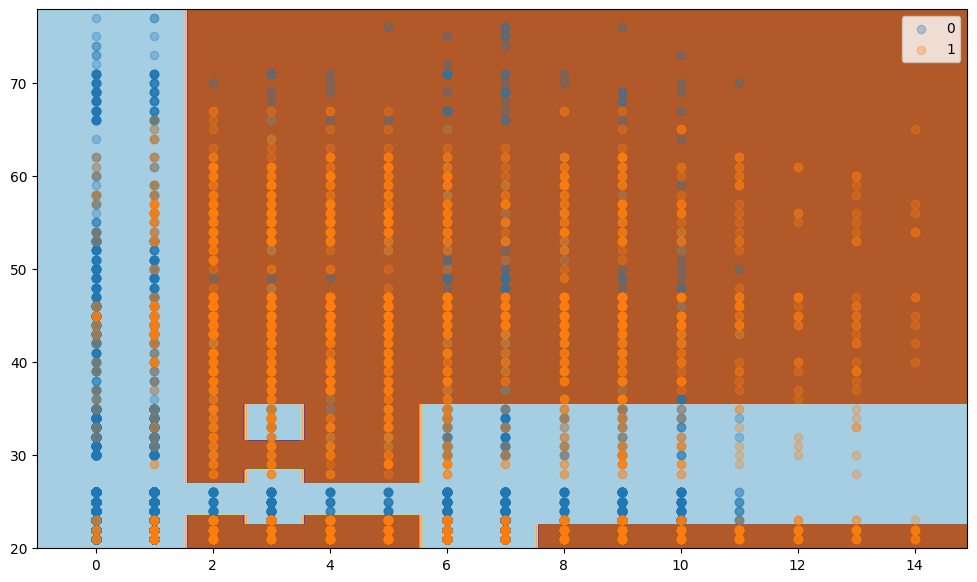

Max depth: 15, F1 score (test): 0.814


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


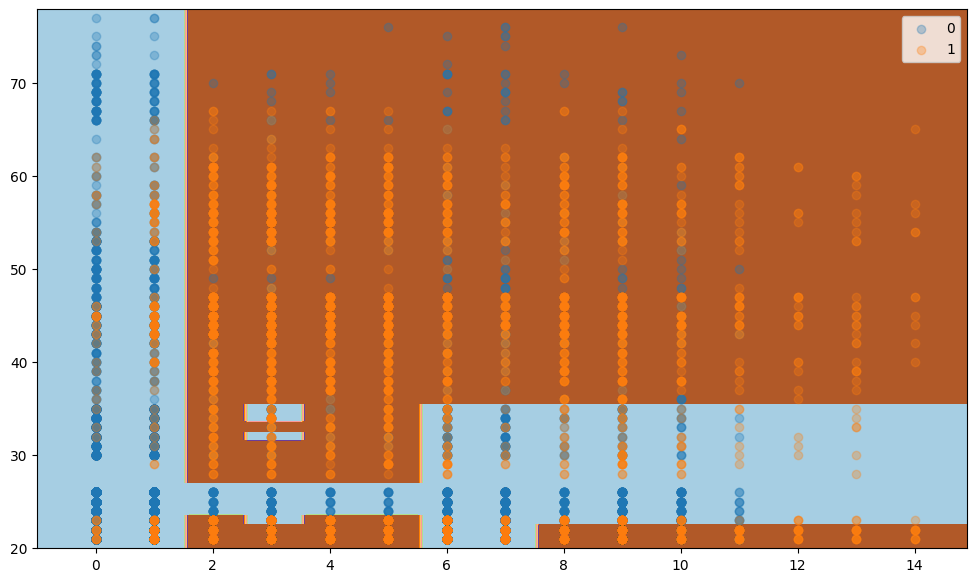

Max depth: 21, F1 score (test): 0.816


In [32]:
from sklearn.ensemble import RandomForestClassifier
max_depth = [3,6,9,15,21]
for depth in max_depth:
    model_forest = RandomForestClassifier(n_estimators=1000, max_depth=depth, min_samples_leaf=int(X_train.shape[0]*0.01))
    model_forest.fit(X_train, y_train)
    plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_forest)
    print(f'Max depth: {depth}, F1 score (test): {f1_score(y_test, model_forest.predict(X_test)):.3f}')

c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


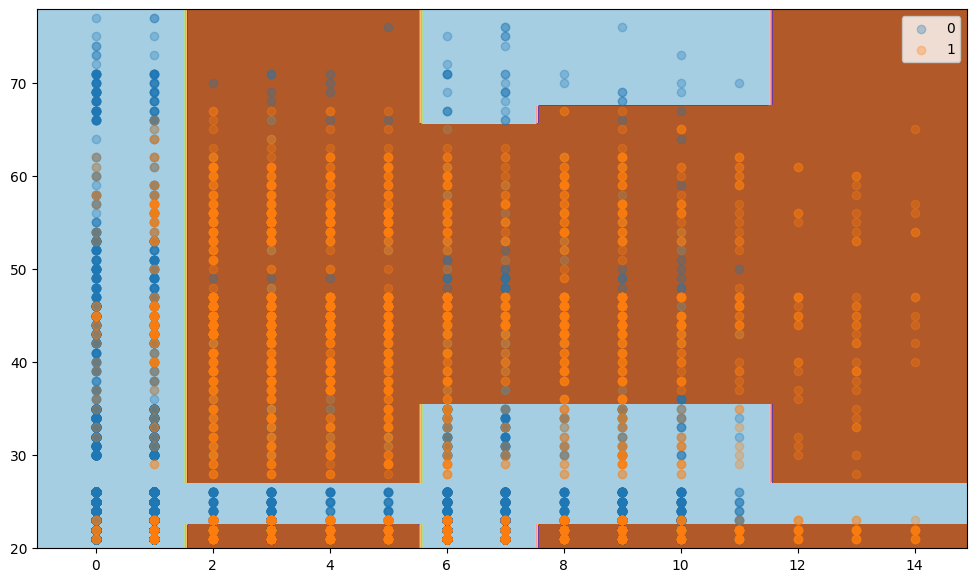

              precision    recall  f1-score   support

           0       0.91      0.90      0.90      3000
           1       0.81      0.81      0.81      1500

    accuracy                           0.87      4500
   macro avg       0.86      0.86      0.86      4500
weighted avg       0.87      0.87      0.87      4500



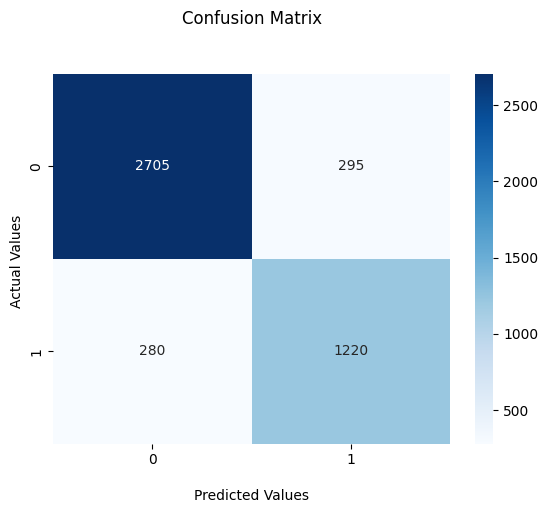

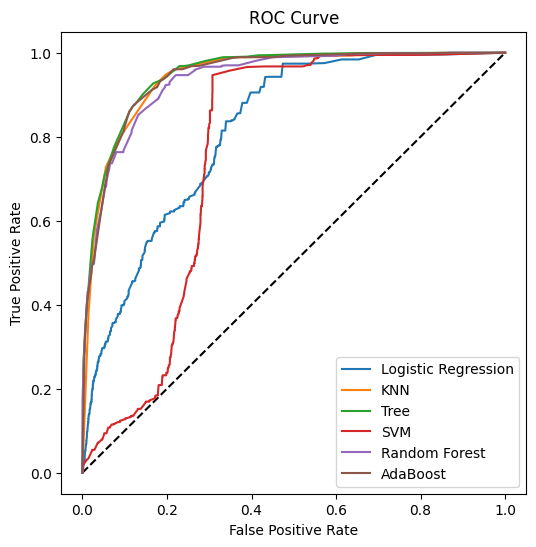

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593
2,Tree,0.825265,0.949433
3,SVM,0.476452,0.761497
4,Random Forest,0.768778,0.936785
5,AdaBoost,0.809287,0.944256


In [33]:
from sklearn.ensemble import AdaBoostClassifier

model_adaboost = AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=1), n_estimators=50)
model_adaboost.fit(X_train, y_train)
plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_adaboost)
calculate_metrics(model_adaboost, 'AdaBoost', X_test, y_test)

c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


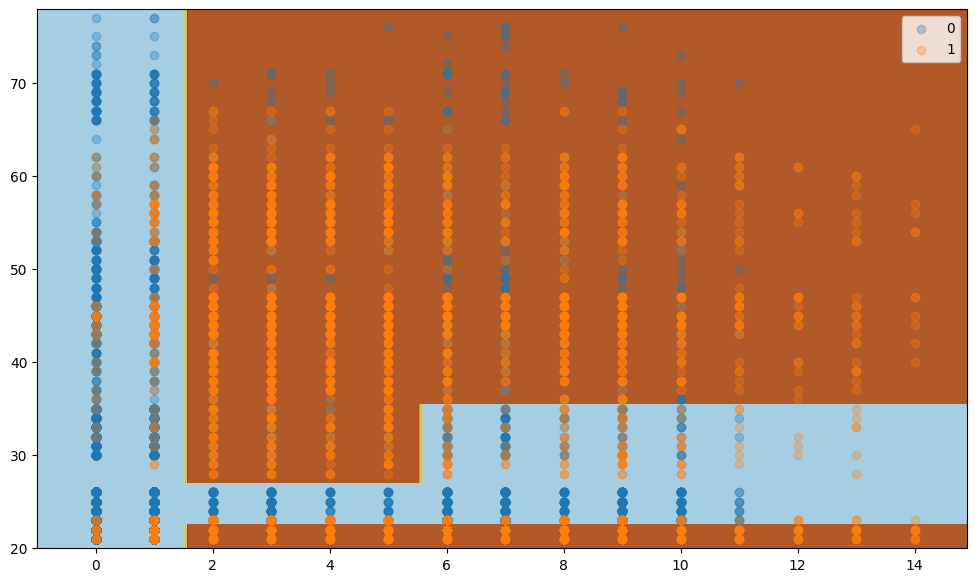

N estimators: 10, F1 score (test): 0.793


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


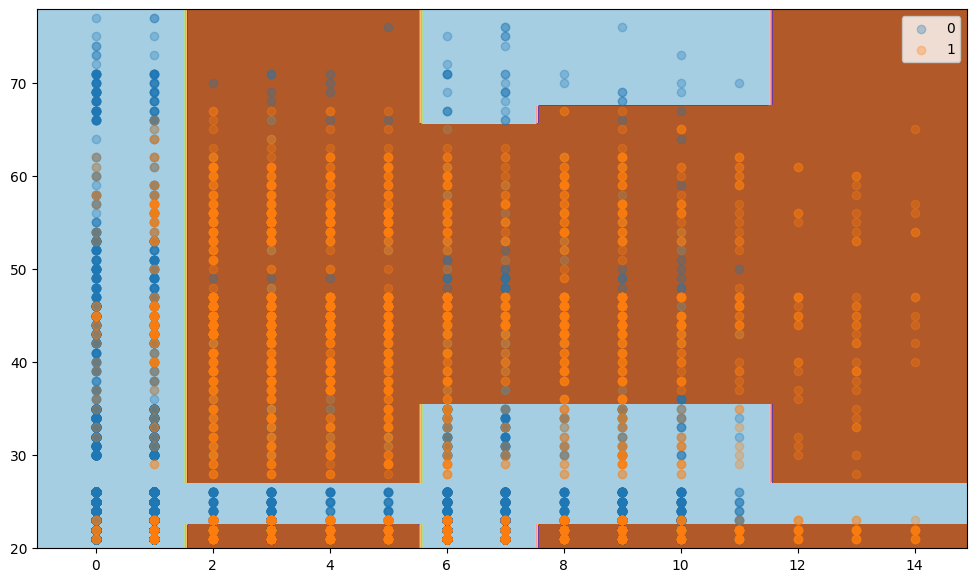

N estimators: 50, F1 score (test): 0.809


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


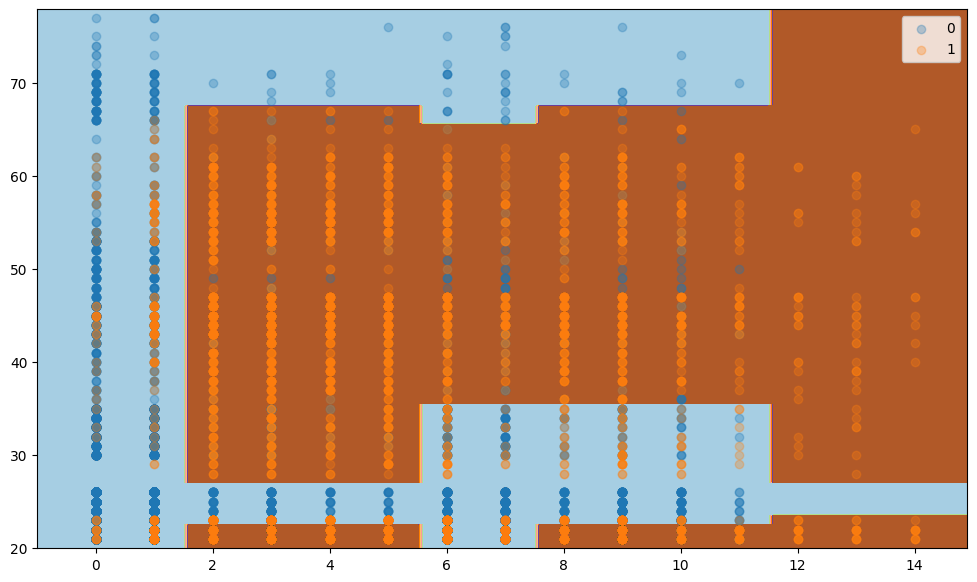

N estimators: 100, F1 score (test): 0.813


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


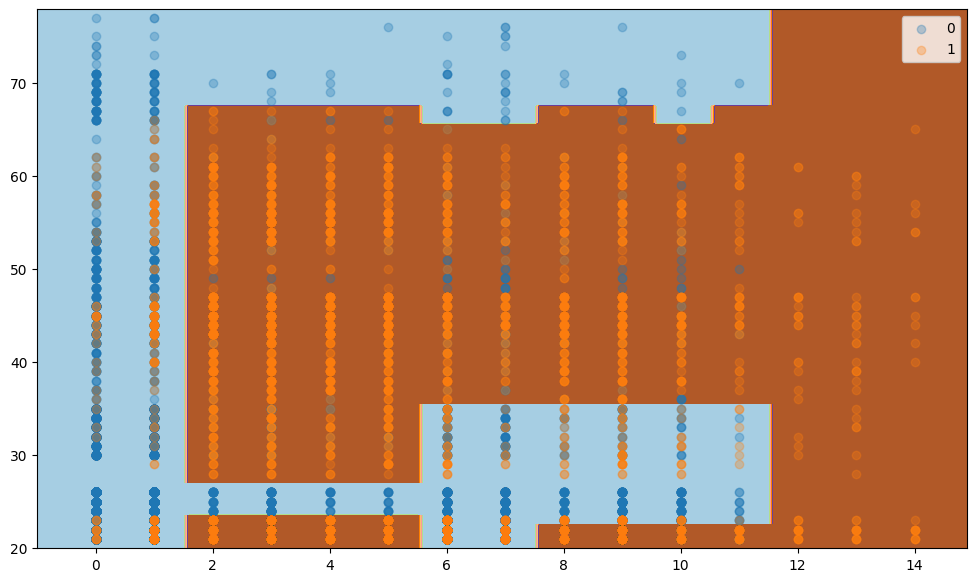

N estimators: 200, F1 score (test): 0.827


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


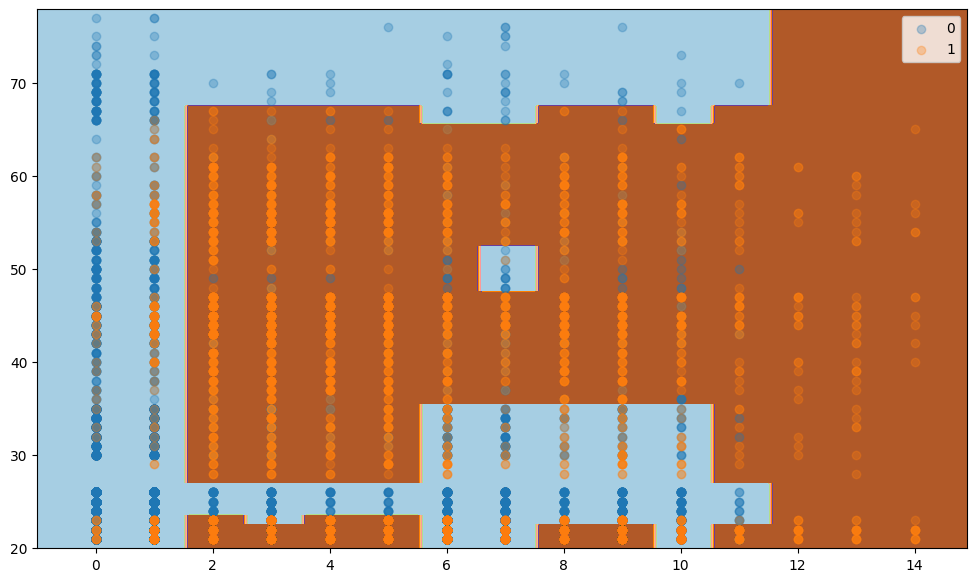

N estimators: 500, F1 score (test): 0.827


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


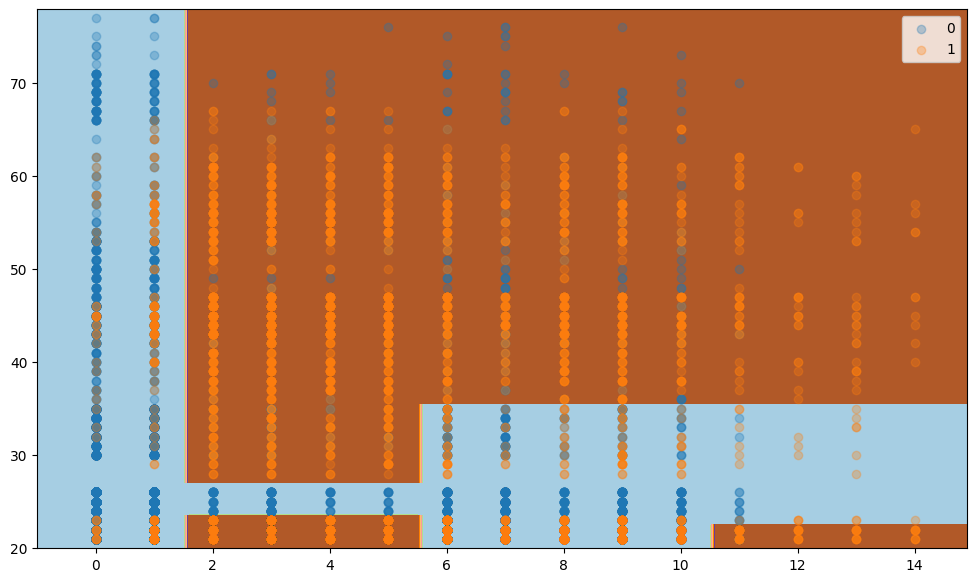

N estimators: 10, F1 score (test): 0.801


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


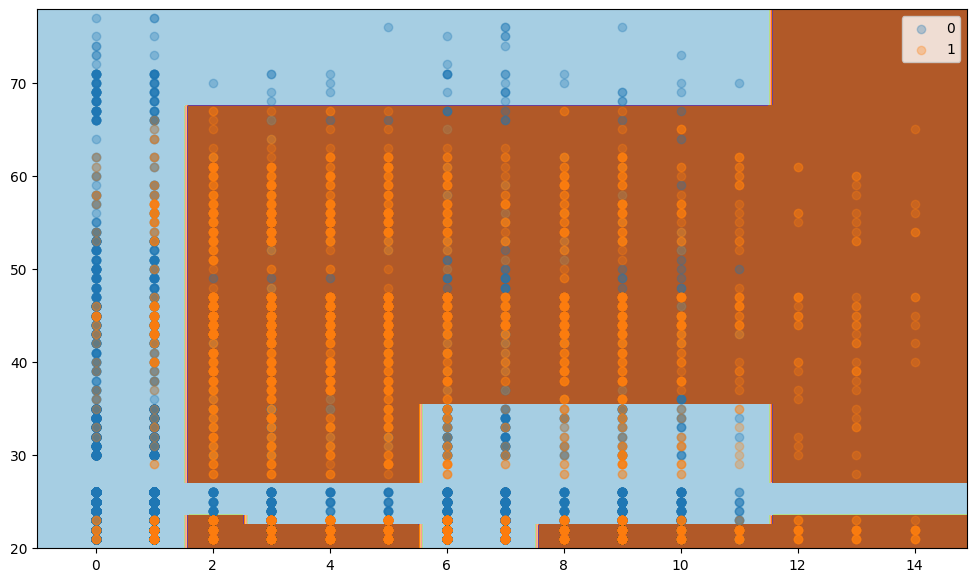

N estimators: 50, F1 score (test): 0.818


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


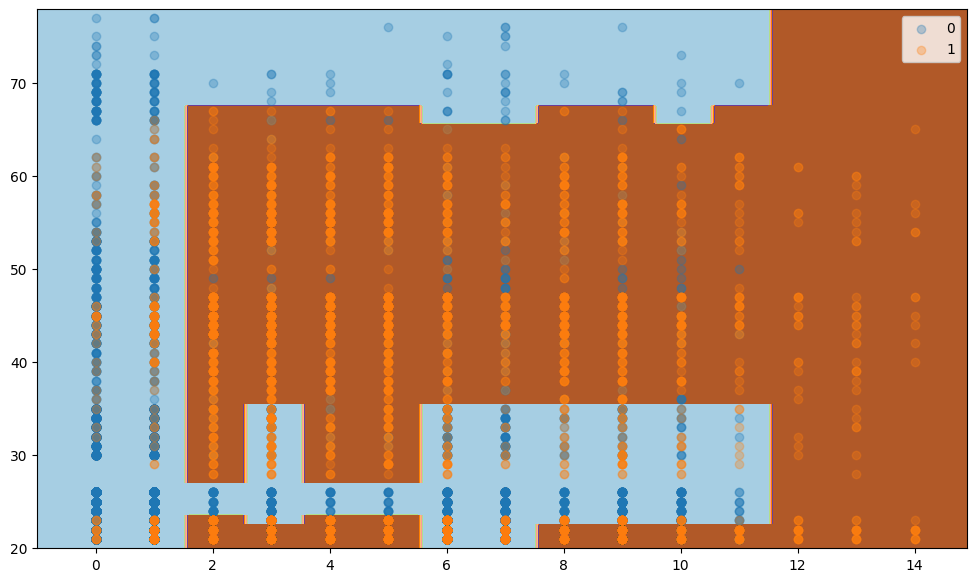

N estimators: 100, F1 score (test): 0.819


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


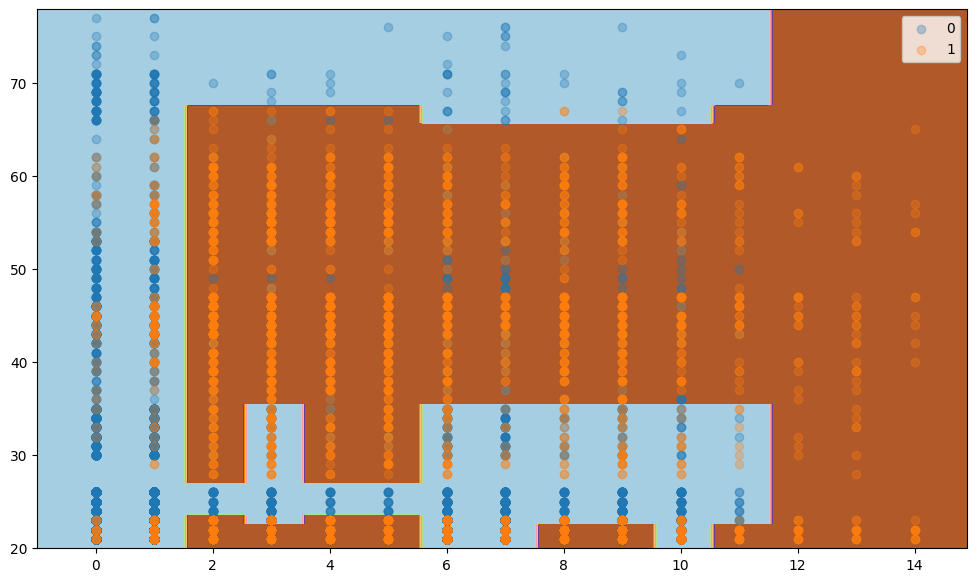

N estimators: 200, F1 score (test): 0.819


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


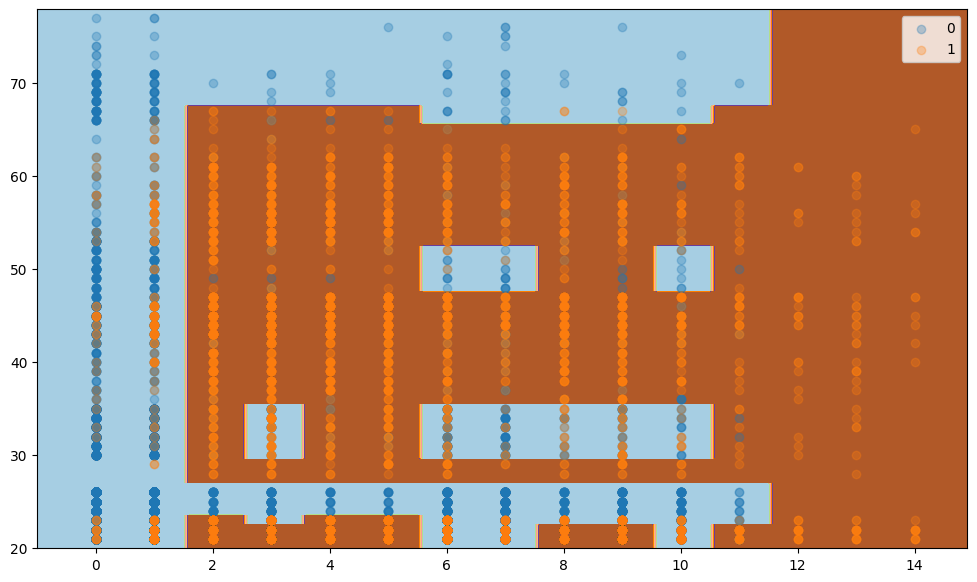

N estimators: 500, F1 score (test): 0.826


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


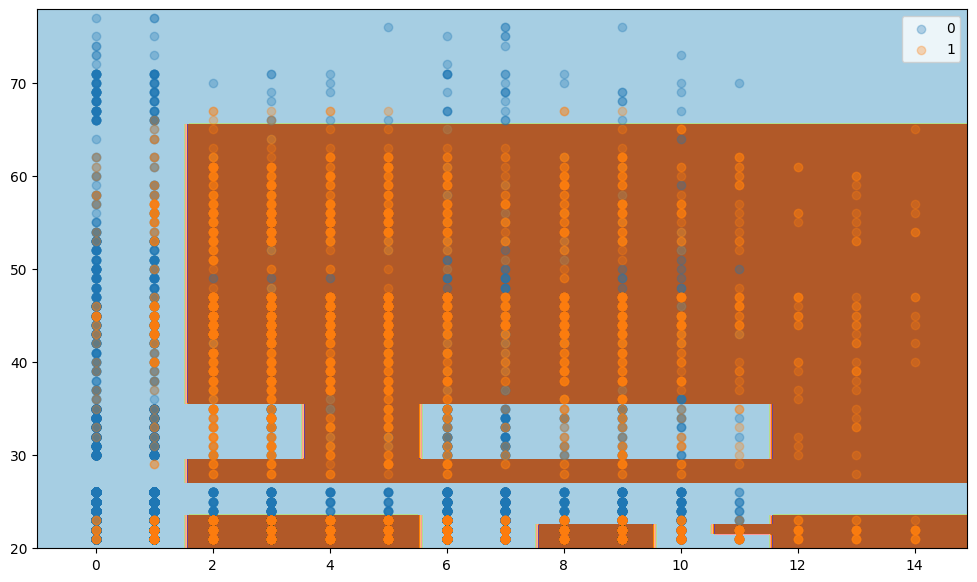

N estimators: 10, F1 score (test): 0.820


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


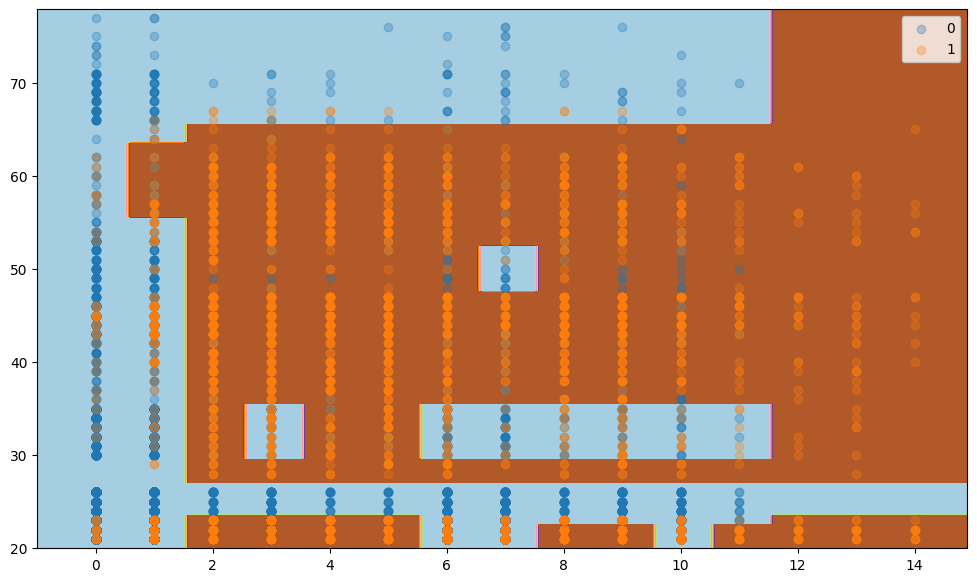

N estimators: 50, F1 score (test): 0.827


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


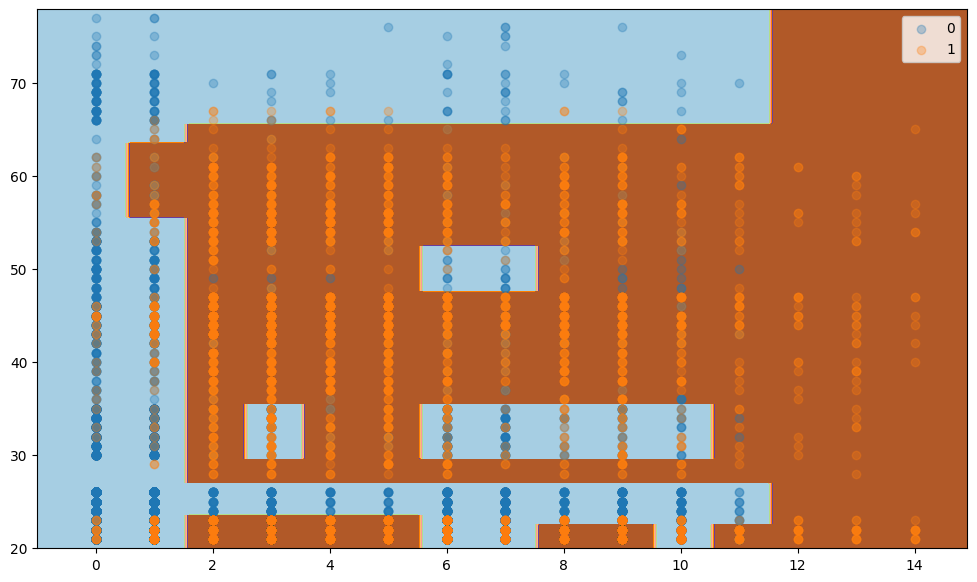

N estimators: 100, F1 score (test): 0.828


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


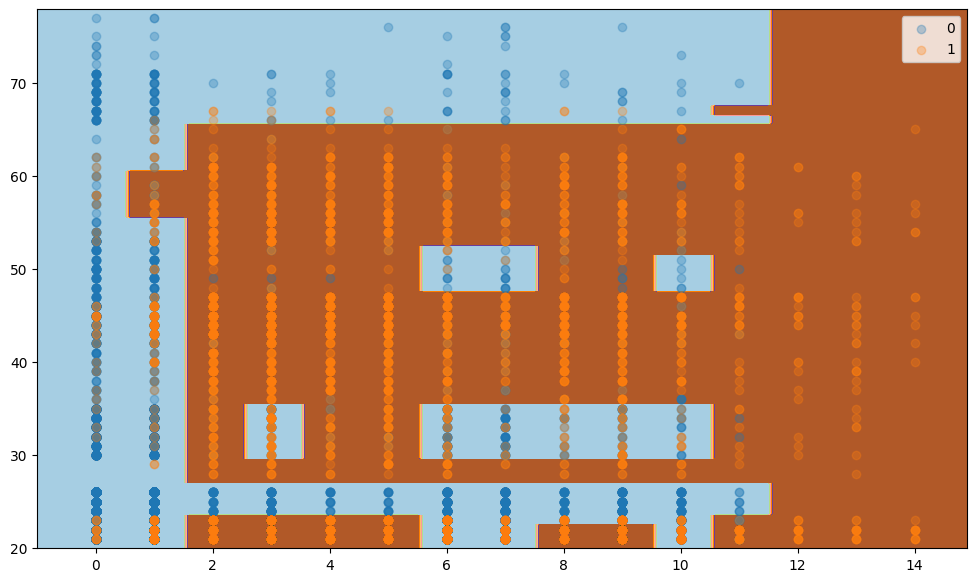

N estimators: 200, F1 score (test): 0.828


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


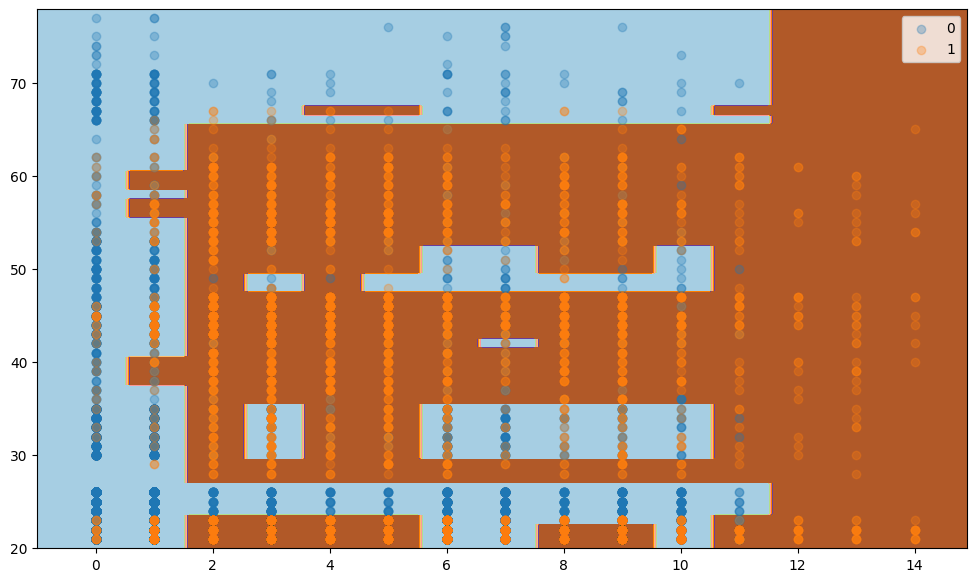

N estimators: 500, F1 score (test): 0.829


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


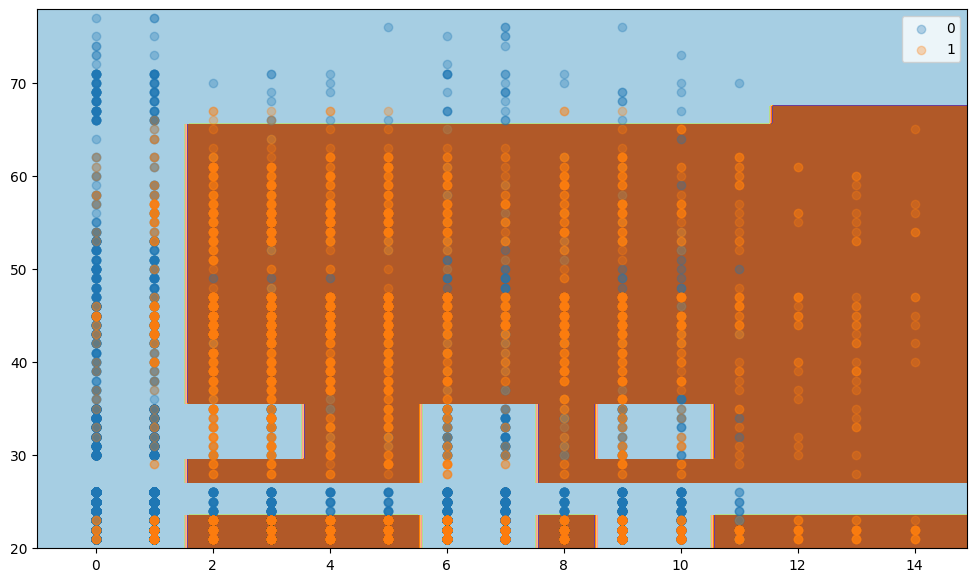

N estimators: 10, F1 score (test): 0.815


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


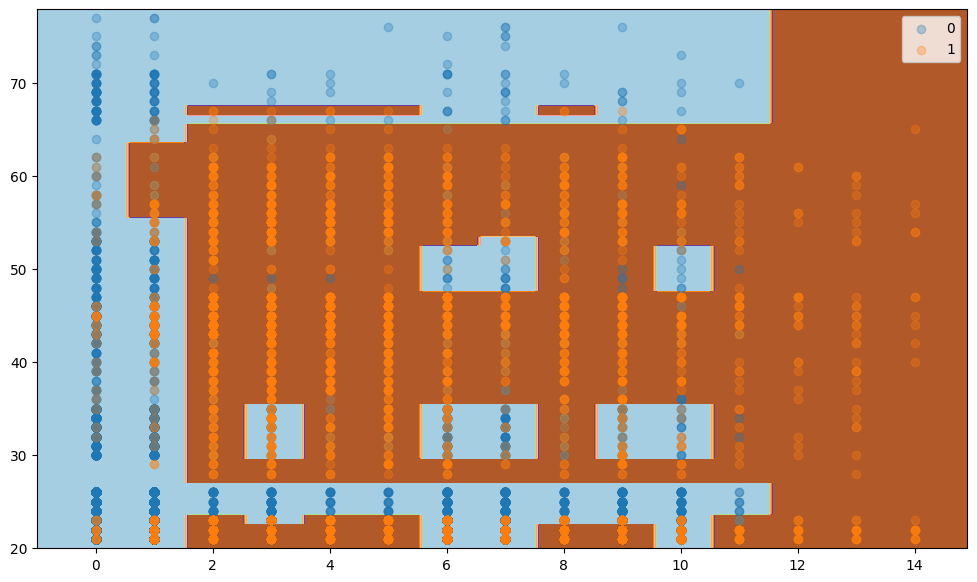

N estimators: 50, F1 score (test): 0.828


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


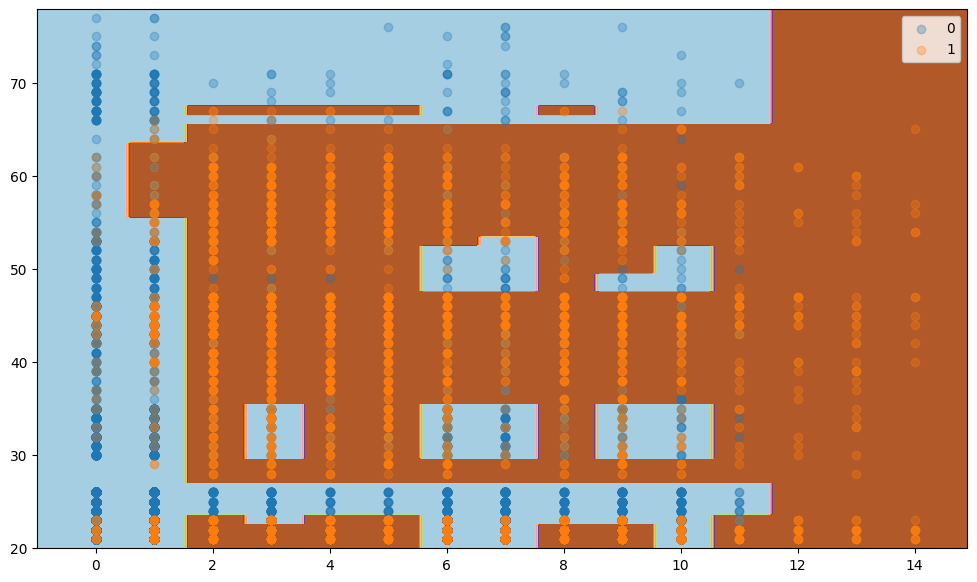

N estimators: 100, F1 score (test): 0.828


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


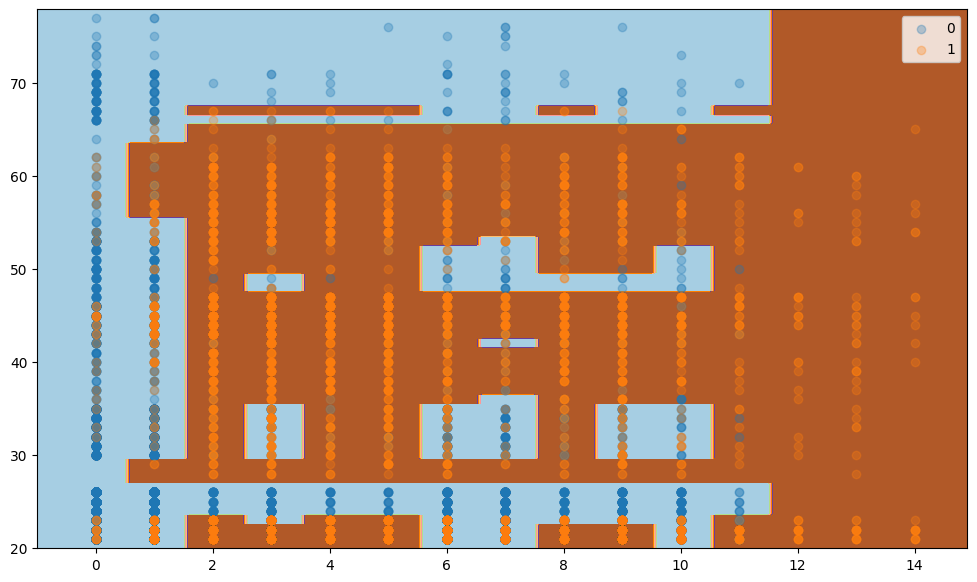

N estimators: 200, F1 score (test): 0.828


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


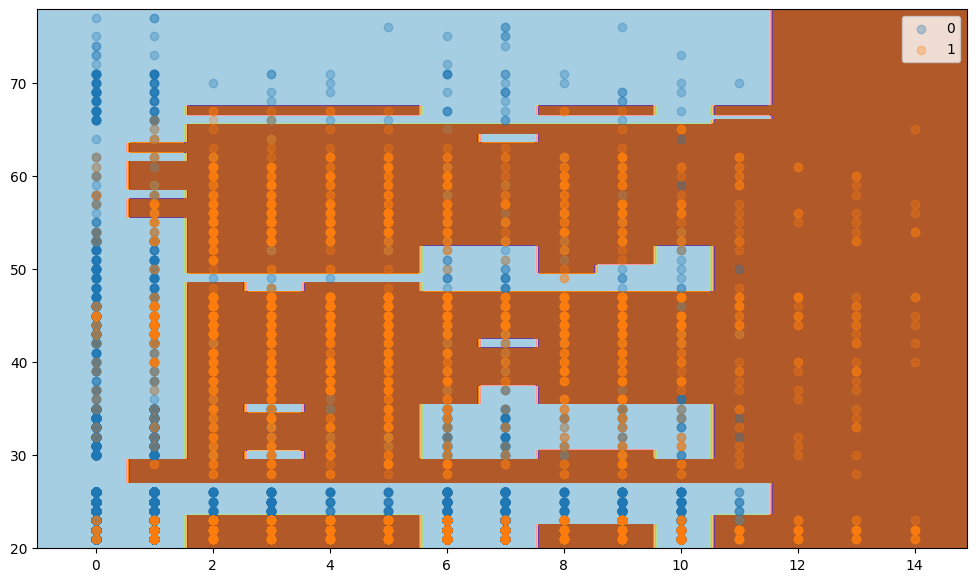

N estimators: 500, F1 score (test): 0.831


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


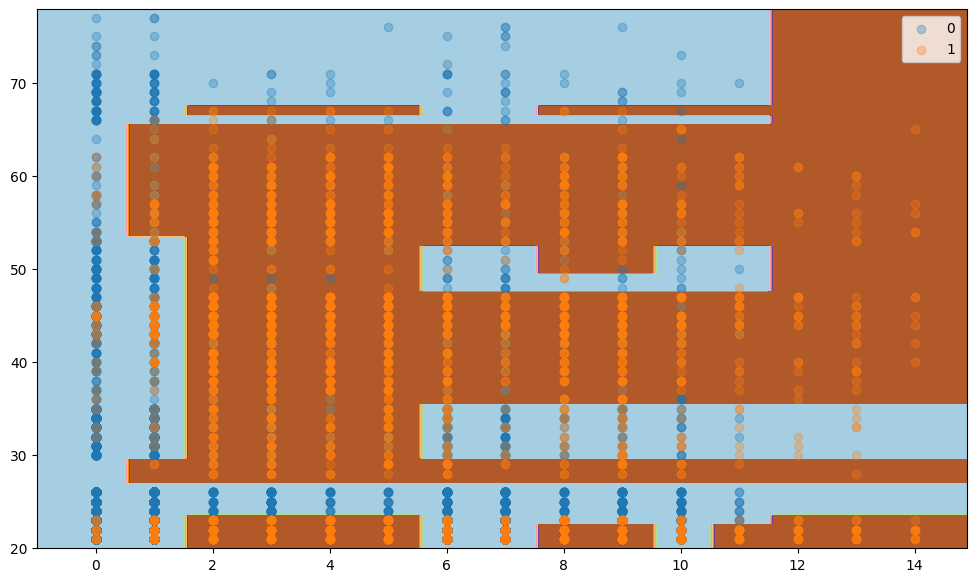

N estimators: 10, F1 score (test): 0.830


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


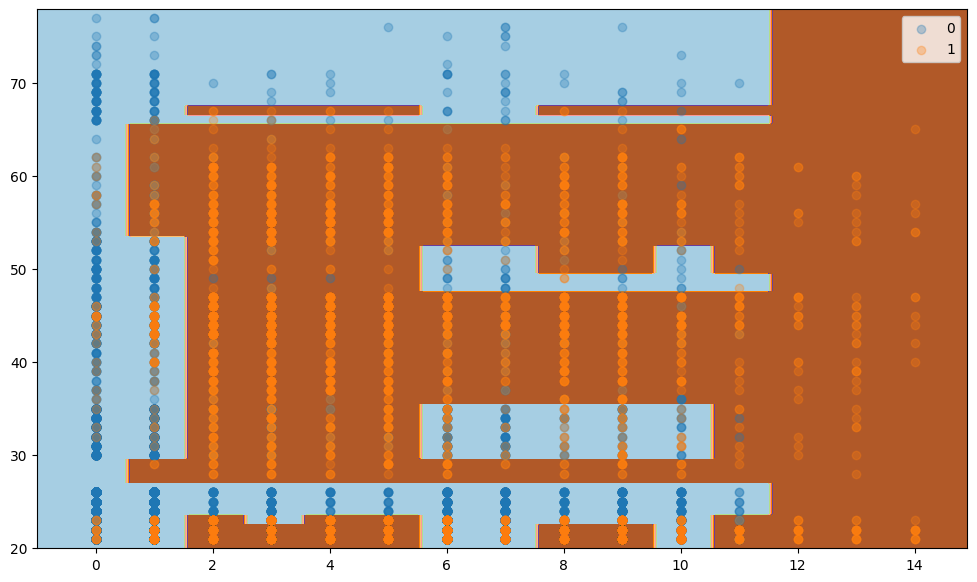

N estimators: 50, F1 score (test): 0.830


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


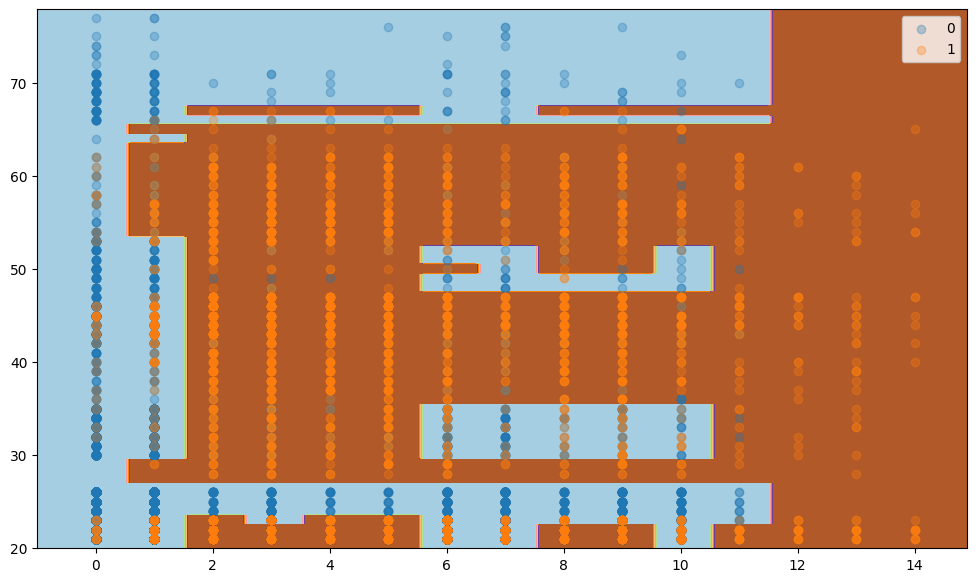

N estimators: 100, F1 score (test): 0.830


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


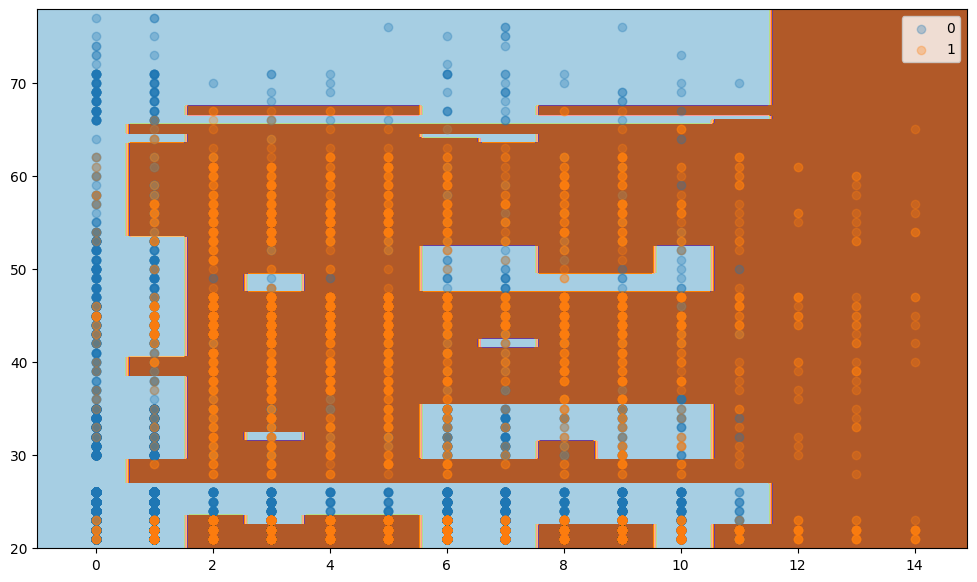

N estimators: 200, F1 score (test): 0.830


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


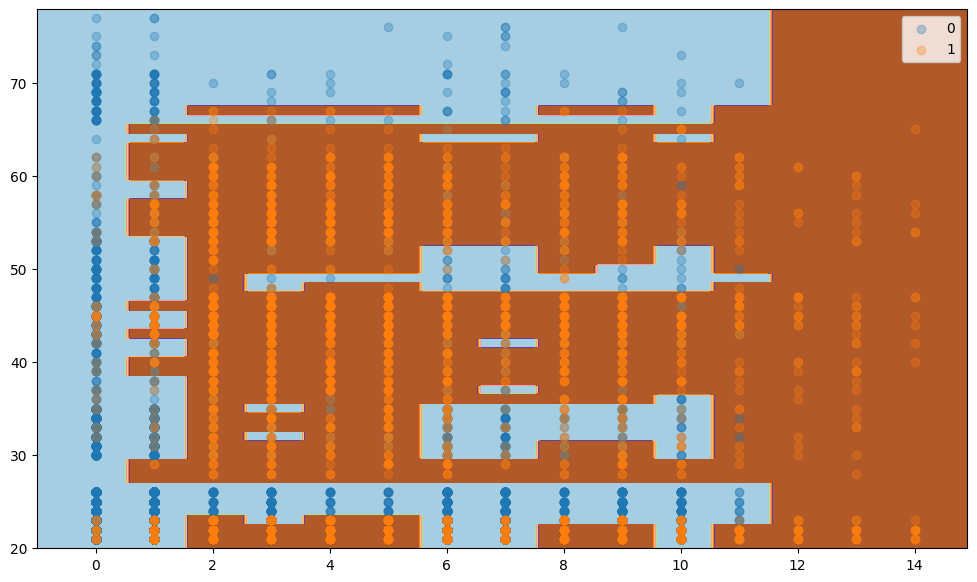

N estimators: 500, F1 score (test): 0.832


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


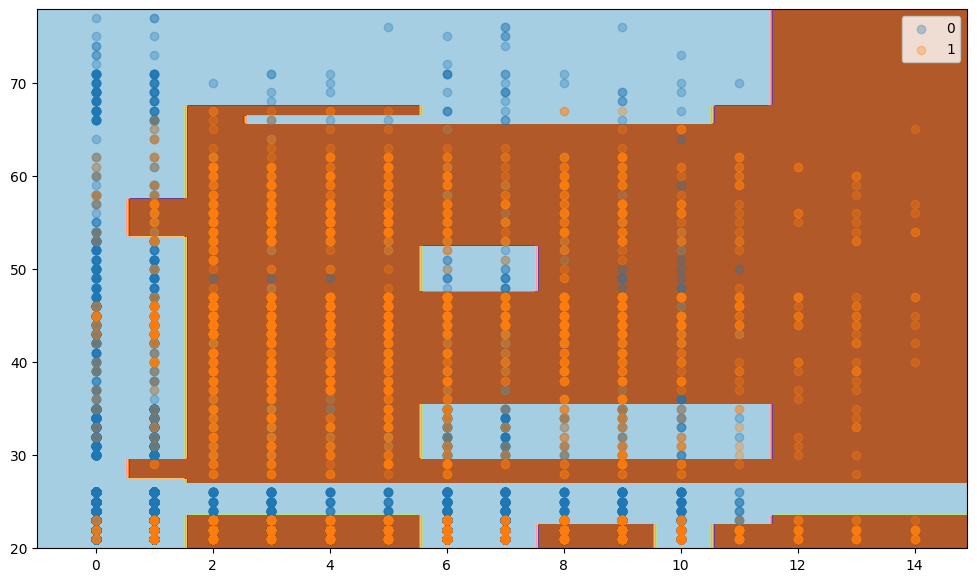

N estimators: 10, F1 score (test): 0.832


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


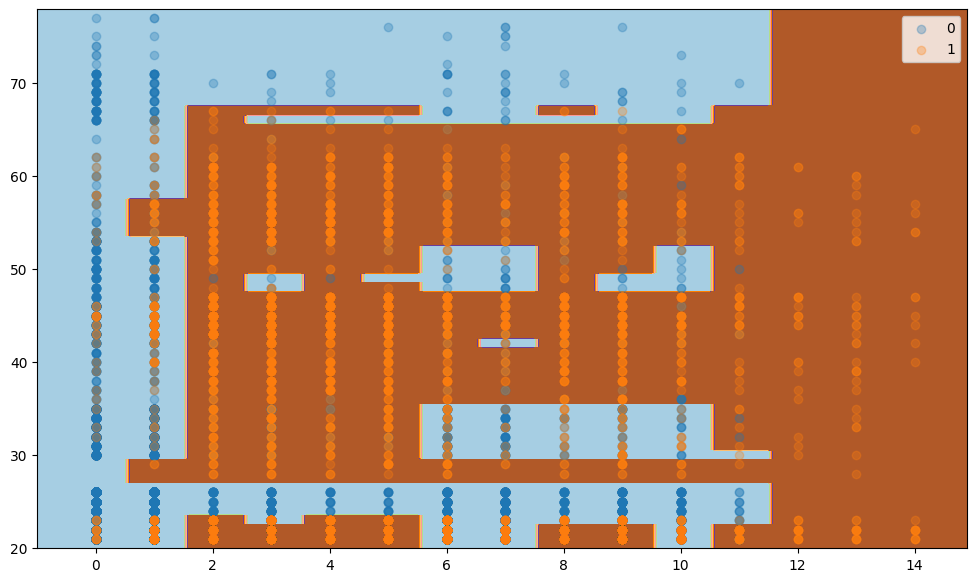

N estimators: 50, F1 score (test): 0.831


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


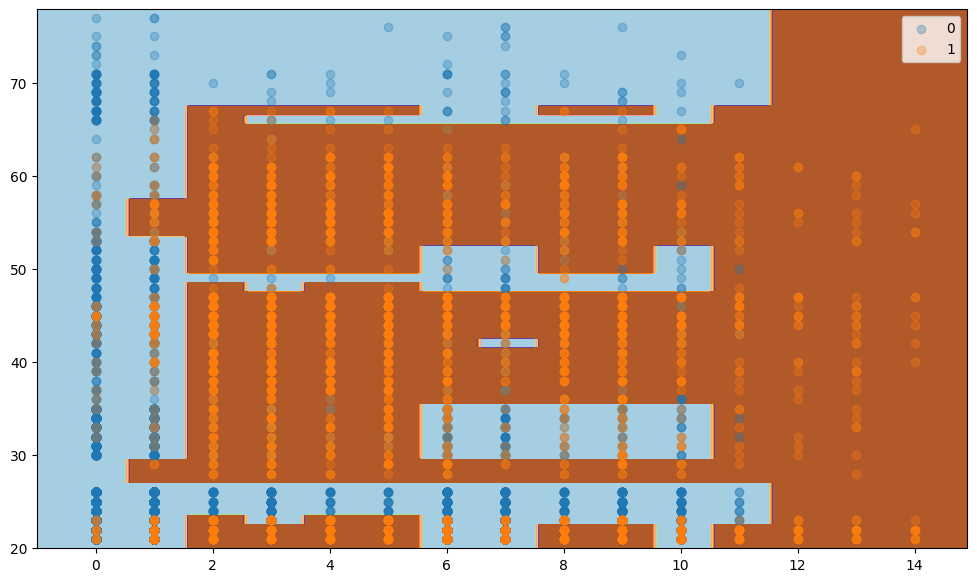

N estimators: 100, F1 score (test): 0.831


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


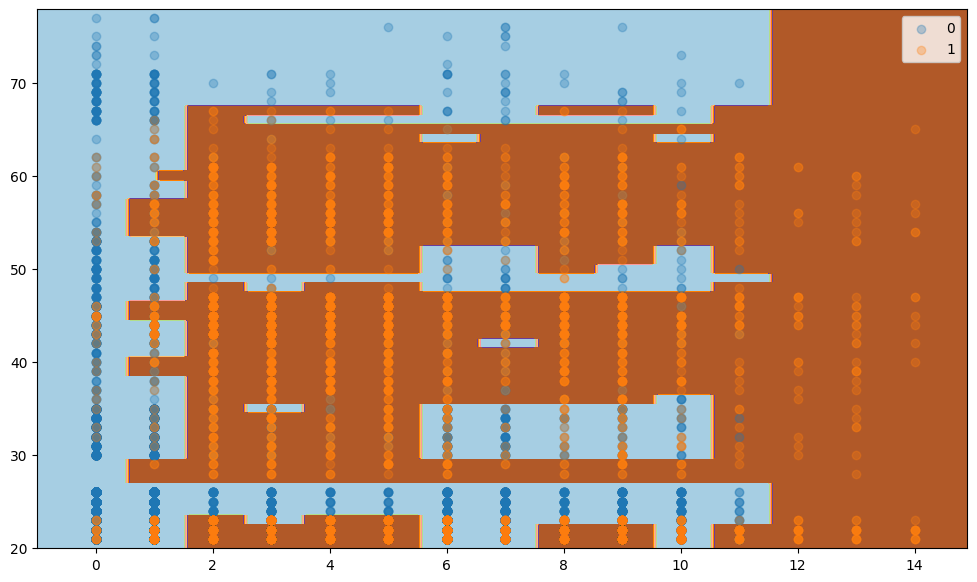

N estimators: 200, F1 score (test): 0.832


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


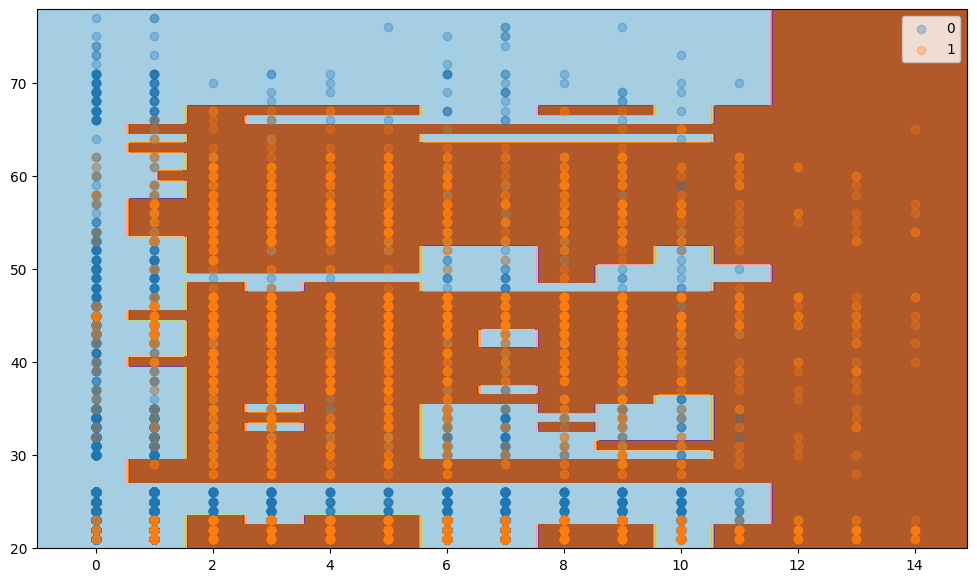

N estimators: 500, F1 score (test): 0.830
    n_estimators  max_depth  f1_score
0             10          1  0.793383
1             50          1  0.809287
2            100          1  0.812976
3            200          1  0.826923
4            500          1  0.827291
5             10          2  0.801377
6             50          2  0.817557
7            100          2  0.819079
8            200          2  0.818971
9            500          2  0.826435
10            10          3  0.819748
11            50          3  0.826702
12           100          3  0.827858
13           200          3  0.828289
14           500          3  0.828787
15            10          4  0.815265
16            50          4  0.828363
17           100          4  0.828363
18           200          4  0.827517
19           500          4  0.831050
20            10          5  0.829870
21            50          5  0.829892
22           100          5  0.829780
23           200          5  0.830164
24      

In [34]:
n_estimators   = [10, 50, 100, 200, 500]
max_depth = [1,2,3,4,5,6]
results = []
for depth in max_depth:
  for estimators in n_estimators:
    model_adaboost = AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=depth), n_estimators=estimators)
    model_adaboost.fit(X_train, y_train)
    plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_adaboost)
    results.append({'n_estimators': estimators, 'max_depth': depth, 'f1_score': f1_score(y_test, model_adaboost.predict(X_test))})
    print(f'N estimators: {estimators}, F1 score (test): {f1_score(y_test, model_adaboost.predict(X_test)):.3f}')
    # calculate_metrics(model_adaboost, 'AdaBoost', X_test, y_test)
print(pd.DataFrame(results))

In [35]:
result = pd.DataFrame(results)
result.sort_values(by='f1_score', ascending=False).head(10)

,n_estimators,max_depth,f1_score
28,200,6,0.832294
25,10,6,0.831979
24,500,5,0.831806
19,500,4,0.831050
27,100,6,0.830698
26,50,6,0.830698
23,200,5,0.830164
21,50,5,0.829892
20,10,5,0.829870
29,500,6,0.829815


c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


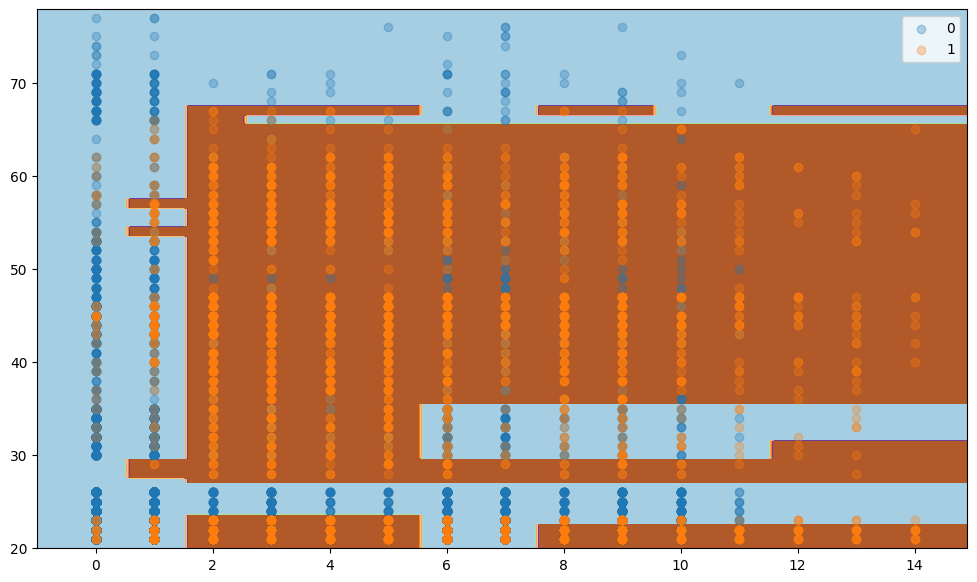

In [36]:
from sklearn.ensemble import VotingClassifier

model_voting = VotingClassifier(estimators=[('Tree', model_tree),
                                            ('Random Forest', model_forest),
                                            ('AdaBoost', model_adaboost)],
                                voting='soft')

model_voting.fit(X_train, y_train)
plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_voting)

              precision    recall  f1-score   support

           0       0.93      0.89      0.91      3000
           1       0.79      0.86      0.82      1500

    accuracy                           0.88      4500
   macro avg       0.86      0.87      0.87      4500
weighted avg       0.88      0.88      0.88      4500



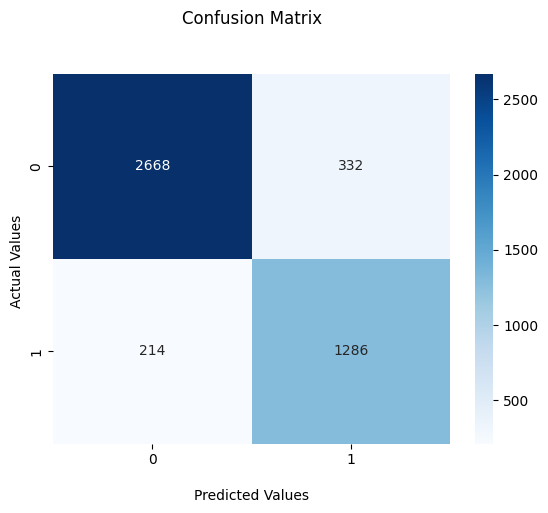

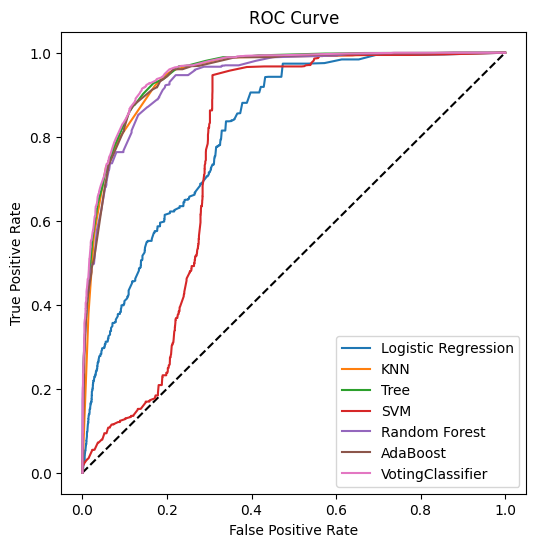

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593
2,Tree,0.825265,0.949433
3,SVM,0.476452,0.761497
4,Random Forest,0.768778,0.936785
5,AdaBoost,0.809287,0.944256
6,VotingClassifier,0.824888,0.951874


In [37]:
calculate_metrics(model_voting, 'VotingClassifier', X_test, y_test)

c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
C:\Users\wista\AppData\Local\Temp\ipykernel_16624\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


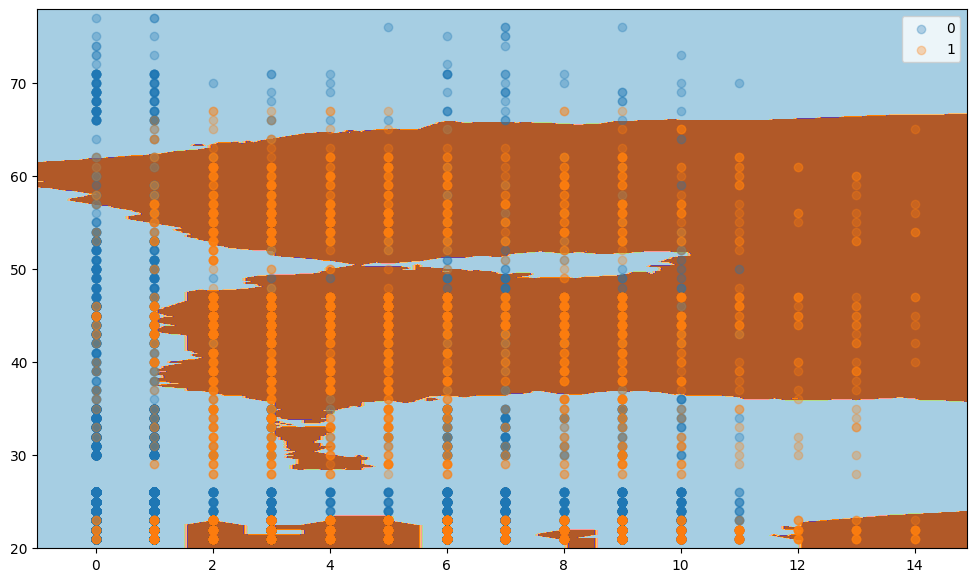

In [38]:
model_voting = VotingClassifier(estimators=[('KNN', model_knn),
                                            ('SVM', model_svm)],
                                voting='soft')

model_voting.fit(X_train, y_train)
plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_voting)

              precision    recall  f1-score   support

           0       0.86      0.94      0.90      3000
           1       0.86      0.69      0.76      1500

    accuracy                           0.86      4500
   macro avg       0.86      0.82      0.83      4500
weighted avg       0.86      0.86      0.85      4500



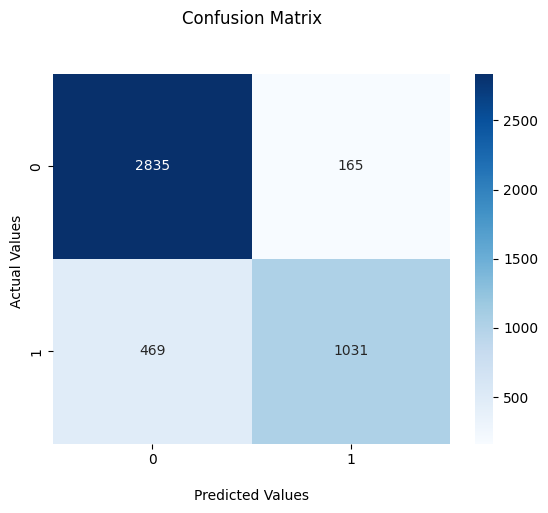

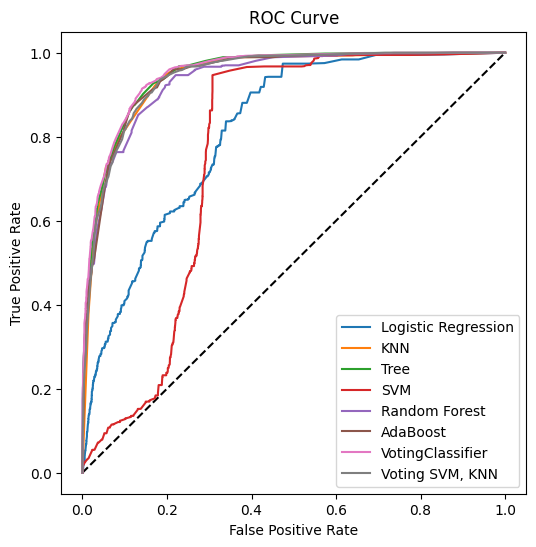

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593
2,Tree,0.825265,0.949433
3,SVM,0.476452,0.761497
4,Random Forest,0.768778,0.936785
5,AdaBoost,0.809287,0.944256
6,VotingClassifier,0.824888,0.951874
7,"Voting SVM, KNN",0.764837,0.943435


In [39]:
calculate_metrics(model_voting, 'Voting SVM, KNN', X_test, y_test)

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0, stratify=y)

In [41]:
from sklearn.model_selection import GridSearchCV

random_forest = RandomForestClassifier(n_estimators=1000, n_jobs=-1)
params_rf = {'max_depth': [3, 5, 10, 20],
             'min_samples_leaf': [3, 5, 10, 15]}
rf_gridsearch = GridSearchCV(random_forest,
                             params_rf,
                             scoring='f1_macro',
                             cv=5,
                             verbose=10, n_jobs=-1)
rf_gridsearch.fit(X_train, y_train)
print('\nBest hyperparameter:', rf_gridsearch.best_params_)
rf_model_v2 = rf_gridsearch.best_estimator_

Fitting 5 folds for each of 16 candidates, totalling 80 fits

Best hyperparameter: {'max_depth': 20, 'min_samples_leaf': 3}


              precision    recall  f1-score   support

           0       0.95      0.96      0.95      3000
           1       0.92      0.90      0.91      1500

    accuracy                           0.94      4500
   macro avg       0.93      0.93      0.93      4500
weighted avg       0.94      0.94      0.94      4500



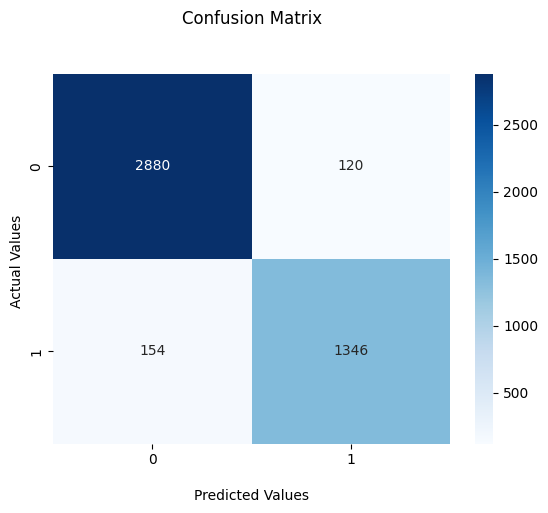

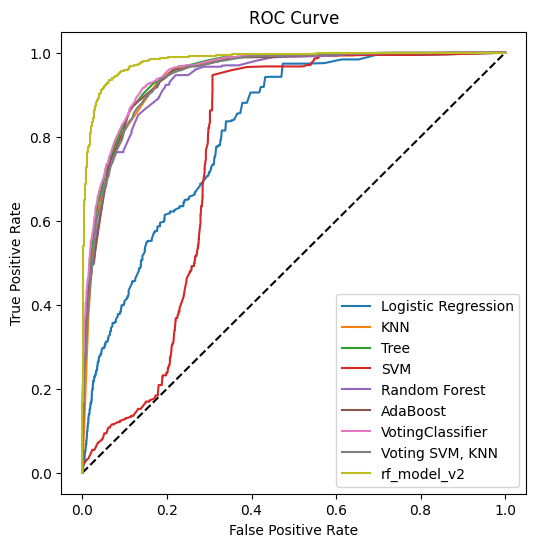

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593
2,Tree,0.825265,0.949433
3,SVM,0.476452,0.761497
4,Random Forest,0.768778,0.936785
5,AdaBoost,0.809287,0.944256
6,VotingClassifier,0.824888,0.951874
7,"Voting SVM, KNN",0.764837,0.943435
8,rf_model_v2,0.907620,0.982700


In [42]:
calculate_metrics(rf_model_v2, 'rf_model_v2', X_test, y_test)

Fitting 5 folds for each of 32 candidates, totalling 160 fits

Best hyperparameter: {'C': 10, 'penalty': 'l2'}
              precision    recall  f1-score   support

           0       0.82      0.88      0.85      3000
           1       0.72      0.62      0.66      1500

    accuracy                           0.79      4500
   macro avg       0.77      0.75      0.76      4500
weighted avg       0.79      0.79      0.79      4500



c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\model_selection\_validation.py:516: FitFailedWarning: 
120 fits failed out of a total of 160.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\model_selection\_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\base.py", line 1363, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Projekty\kodilla\modul_14\.venv\Lib\site-packages\sklearn\linear_model\_logi

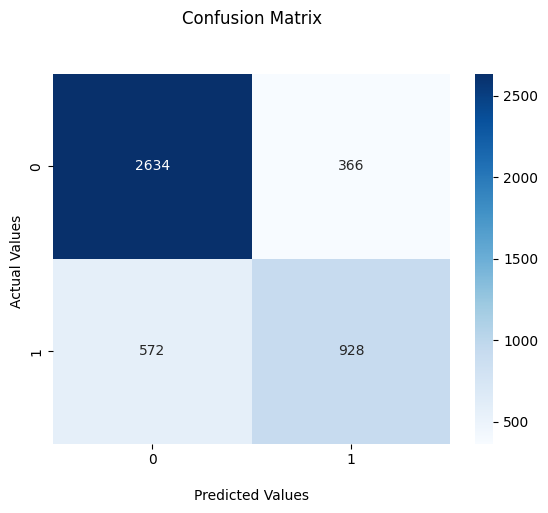

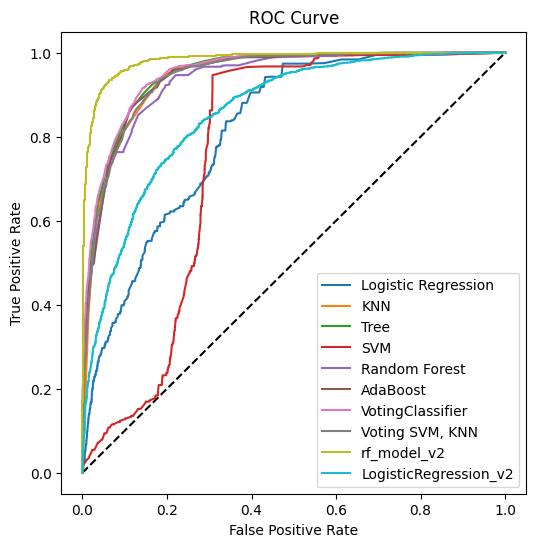

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593
2,Tree,0.825265,0.949433
3,SVM,0.476452,0.761497
4,Random Forest,0.768778,0.936785
5,AdaBoost,0.809287,0.944256
6,VotingClassifier,0.824888,0.951874
7,"Voting SVM, KNN",0.764837,0.943435
8,rf_model_v2,0.907620,0.982700
9,LogisticRegression_v2,0.664281,0.858620


In [43]:
from sklearn.model_selection import GridSearchCV

logistic_regresion = LogisticRegression()
params_rf = {'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000],
             'penalty': ['l1', 'l2', 'elasticnet', 'none']}
rf_gridsearch = GridSearchCV(logistic_regresion,
                             params_rf,
                             scoring='f1_macro',
                             cv=5,
                             verbose=10, n_jobs=-1)
rf_gridsearch.fit(X_train, y_train)
print('\nBest hyperparameter:', rf_gridsearch.best_params_)
lr_v2_model = rf_gridsearch.best_estimator_

calculate_metrics(lr_v2_model, 'LogisticRegression_v2', X_test, y_test)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits

Best hyperparameter: {'n_neighbors': 10, 'p': 1, 'weights': 'distance'}
              precision    recall  f1-score   support

           0       0.89      0.94      0.91      3000
           1       0.86      0.77      0.81      1500

    accuracy                           0.88      4500
   macro avg       0.88      0.85      0.86      4500
weighted avg       0.88      0.88      0.88      4500



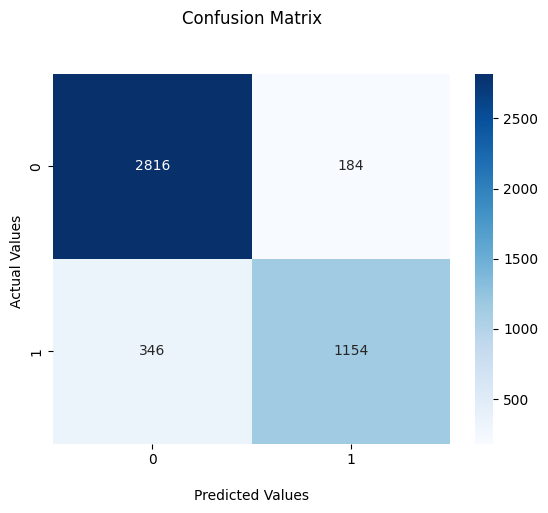

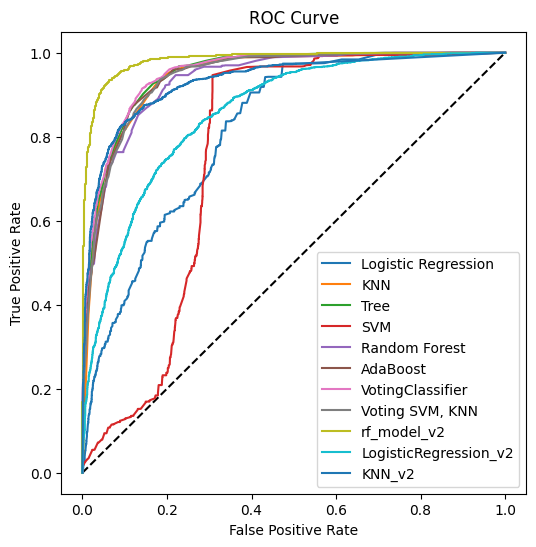

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593
2,Tree,0.825265,0.949433
3,SVM,0.476452,0.761497
4,Random Forest,0.768778,0.936785
5,AdaBoost,0.809287,0.944256
6,VotingClassifier,0.824888,0.951874
7,"Voting SVM, KNN",0.764837,0.943435
8,rf_model_v2,0.907620,0.982700
9,LogisticRegression_v2,0.664281,0.858620


In [44]:
from sklearn.model_selection import GridSearchCV

knn = KNeighborsClassifier()
params_rf = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
             'weights': ['uniform', 'distance'],
             'p': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}
rf_gridsearch = GridSearchCV(knn,
                             params_rf,
                             scoring='f1_macro',
                             cv=5,
                             verbose=10, n_jobs=-1)
rf_gridsearch.fit(X_train, y_train)
print('\nBest hyperparameter:', rf_gridsearch.best_params_)
knn_v2_model = rf_gridsearch.best_estimator_

calculate_metrics(knn_v2_model, 'KNN_v2', X_test, y_test)

Fitting 5 folds for each of 8 candidates, totalling 40 fits

Best hyperparameter: {'C': 1000}
              precision    recall  f1-score   support

           0       0.88      0.92      0.90      3000
           1       0.82      0.74      0.78      1500

    accuracy                           0.86      4500
   macro avg       0.85      0.83      0.84      4500
weighted avg       0.86      0.86      0.86      4500



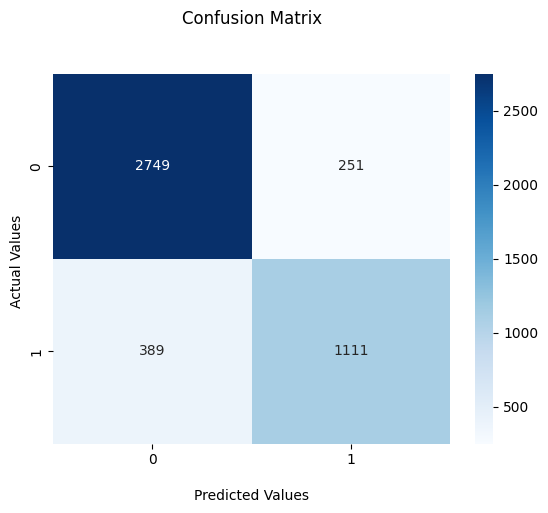

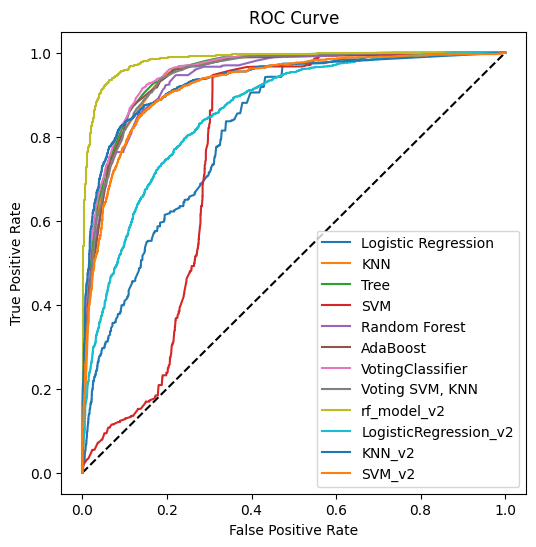

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593
2,Tree,0.825265,0.949433
3,SVM,0.476452,0.761497
4,Random Forest,0.768778,0.936785
5,AdaBoost,0.809287,0.944256
6,VotingClassifier,0.824888,0.951874
7,"Voting SVM, KNN",0.764837,0.943435
8,rf_model_v2,0.907620,0.982700
9,LogisticRegression_v2,0.664281,0.858620


In [45]:
from sklearn.model_selection import GridSearchCV

svm = SVC(probability=True)
params_rf = {'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000],}
rf_gridsearch = GridSearchCV(svm,
                             params_rf,
                             scoring='f1_macro',
                             cv=5,
                             verbose=10, n_jobs=-1)
rf_gridsearch.fit(X_train, y_train)
print('\nBest hyperparameter:', rf_gridsearch.best_params_)
svm_v2_model = rf_gridsearch.best_estimator_

calculate_metrics(svm_v2_model, 'SVM_v2', X_test, y_test)

Fitting 5 folds for each of 18 candidates, totalling 90 fits

Best hyperparameter: {'max_depth': 6, 'min_samples_leaf': 0.0001}
              precision    recall  f1-score   support

           0       0.93      0.92      0.93      3000
           1       0.85      0.87      0.86      1500

    accuracy                           0.90      4500
   macro avg       0.89      0.90      0.89      4500
weighted avg       0.90      0.90      0.90      4500



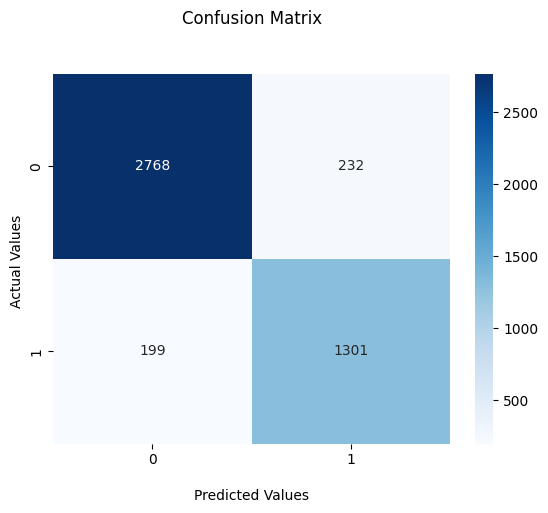

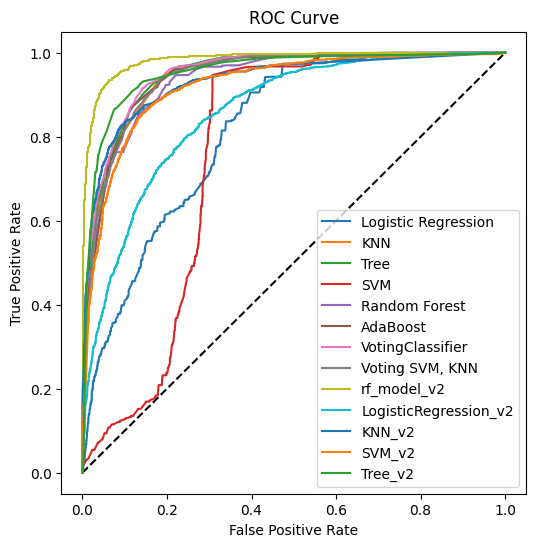

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593
2,Tree,0.825265,0.949433
3,SVM,0.476452,0.761497
4,Random Forest,0.768778,0.936785
5,AdaBoost,0.809287,0.944256
6,VotingClassifier,0.824888,0.951874
7,"Voting SVM, KNN",0.764837,0.943435
8,rf_model_v2,0.907620,0.982700
9,LogisticRegression_v2,0.664281,0.858620


In [46]:
from sklearn.model_selection import GridSearchCV

tree = DecisionTreeClassifier()
params_rf = {'max_depth': [1, 2, 3, 4, 5, 6],
             'min_samples_leaf': [0.001, 0.005, 0.0001]}
rf_gridsearch = GridSearchCV(tree,
                             params_rf,
                             scoring='f1_macro',
                             cv=5,
                             verbose=10, n_jobs=-1)
rf_gridsearch.fit(X_train, y_train)
print('\nBest hyperparameter:', rf_gridsearch.best_params_)
tree_v2_model = rf_gridsearch.best_estimator_

calculate_metrics(tree_v2_model, 'Tree_v2', X_test, y_test)

Fitting 5 folds for each of 30 candidates, totalling 150 fits

Best hyperparameter: {'estimator': DecisionTreeClassifier(max_depth=3), 'n_estimators': 200}
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      3000
           1       0.93      0.93      0.93      1500

    accuracy                           0.95      4500
   macro avg       0.95      0.95      0.95      4500
weighted avg       0.95      0.95      0.95      4500



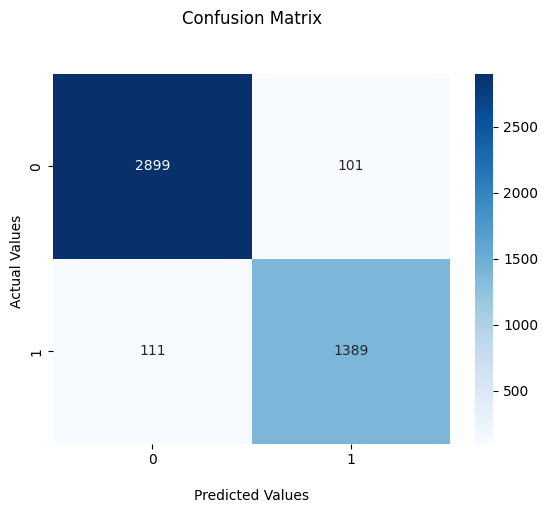

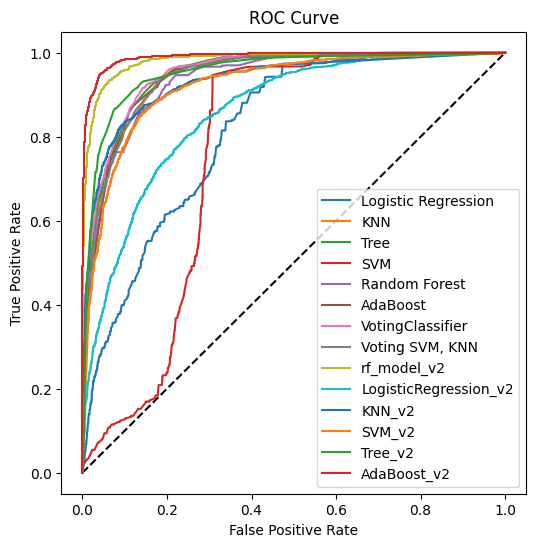

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,KNN,0.808367,0.942593
2,Tree,0.825265,0.949433
3,SVM,0.476452,0.761497
4,Random Forest,0.768778,0.936785
5,AdaBoost,0.809287,0.944256
6,VotingClassifier,0.824888,0.951874
7,"Voting SVM, KNN",0.764837,0.943435
8,rf_model_v2,0.907620,0.982700
9,LogisticRegression_v2,0.664281,0.858620


In [48]:
from sklearn.model_selection import GridSearchCV

ada_boost = AdaBoostClassifier()
params_rf = {'n_estimators': [10, 50, 100, 200, 500],
             'estimator': [DecisionTreeClassifier(max_depth=1),
                           DecisionTreeClassifier(max_depth=2),
                           DecisionTreeClassifier(max_depth=3),
                           DecisionTreeClassifier(max_depth=4),
                           DecisionTreeClassifier(max_depth=5),
                           DecisionTreeClassifier(max_depth=6)]}
rf_gridsearch = GridSearchCV(ada_boost,
                             params_rf,
                             scoring='f1_macro',
                             cv=5,
                             verbose=10, n_jobs=-1)
rf_gridsearch.fit(X_train, y_train)
print('\nBest hyperparameter:', rf_gridsearch.best_params_)
ada_boost_v2_model = rf_gridsearch.best_estimator_

calculate_metrics(ada_boost_v2_model, 'AdaBoost_v2', X_test, y_test)